 Works with the HMF files. Takes the windows from the Del labeled windows from all chromosomes. The windows were labeled by HMF with a caller. Then performs normalization of the channels, that depends on the median coverage and expected library insert size. Then plots every fifth of the windows.

## Load dependences and setting output configuration

In [1]:
import numpy as np
from keras.utils.np_utils import to_categorical
import keras
%pylab inline
%load_ext autoreload
%autoreload 2

Using TensorFlow backend.


Populating the interactive namespace from numpy and matplotlib


## Load data 

In [38]:
datapath='F:/1_GTCG/data/20_04_18/HMF_Data_200418.tar/HMF_Data_200418/channelData/'
datapath_labels = 'F:/1_GTCG/data/20_04_18/HMF_Data_200418.tar/HMF_Data_200418/labels/labels/'
filename = '_channel_maker_real.npy'

### Load the SV files

In [39]:
X_test=np.load(datapath + 'X_50_allSVs_22channels.npy')
y_test=np.load(datapath + 'y_50_allSVs_22channels.npy')

In [40]:
X_test.shape

(488, 22, 50)

In [41]:
y_test.shape

(488,)

### Number of channels

In [42]:
number_channels = X_test.shape[1]
number_channels

22

In [7]:
#X_test=X_test[np.where(y_test != 'no_del')]
#y_test= y_test[np.where(y_test != 'no_del')]

In [43]:
X_test.shape

(488, 22, 50)

In [44]:
y_test.shape

(488,)

## Normalize data 

In [45]:
coverage_normal = np.median(X_test[:, 11, :]) #the median of the coverage in the normal cells
coverage_normal

34.0

In [46]:
coverage_tumor = np.median(X_test[:, 0, :]) #the median of the coverage in the tumor cells
coverage_tumor

101.0

In [47]:
expected_distance = 150
ones_normal = np.ones(X_test.shape[2])*expected_distance*coverage_normal
ones_tumor = np.ones(X_test.shape[2])*expected_distance*coverage_tumor
def normalize(X):       
    for i in range (0, len(X)):                    
        for k in [3,4,5,6]:#the distance channels
            X[i][k] = np.minimum(X[i][k], ones_tumor)
            X[i][k] = np.divide(X[i][k], expected_distance)
        for k in [14,15,16,17]:#the distance channels
            X[i][k] = np.minimum(X[i][k], ones_normal)
            X[i][k] = np.divide(X[i][k], expected_distance)    
        for j in range(0, int(number_channels/2)):            
            X[i][j] = np.divide(X[i][j], coverage_tumor)*100  
        for j in range(int(number_channels/2), number_channels):            
            X[i][j] = np.divide(X[i][j], coverage_normal)*100     
#normalize(X_train)
#normalize(X_val)
normalize(X_test)

In [48]:
def eliminate_noise_chanels(X):
    return np.delete(X, [3, 6, 14, 17], axis=1)

In [49]:
X_test = eliminate_noise_chanels(X_test)

In [50]:
number_channels = X_test.shape[1]
number_channels

18

## Plots several  windows 

In [51]:

label = ["None"] * number_channels

In [52]:
label[0] = "tumor:coverage"
label[1] = "tumor:#left clipped reads"
label[2] = "tumor:#right clipped reads"
label[3] = "tumor:sum of distances to mates for forward reads"
label[4] = "tumor:sum of distances to mates for reverse reads"
label[5] = "tumor:#split reads left split"
label[6] = "tumor:#split reads right split"
label[7] = "tumor:sum of gaps for left split reads"
label[8] = "tumor: sum of gaps for right split reads"

In [53]:
label[0+9] = "normal:coverage"
label[1+9] = "normal:#left clipped reads"
label[2+9] = "normal:#right clipped reads"
label[3+9] = "normal:sum of distances to mates for forward reads"
label[4+9] = "normal:sum of distances to mates for reverse reads"
label[5+9] = "normal:#split reads left split"
label[6+9] = "normal:#split reads right split"
label[7+9] = "normal:sum of gaps for left split reads"
label[8+9] = "normal: sum of gaps for right split reads"

In [54]:
from numpy import *
import math
import matplotlib.pyplot as plt

colors =['b','g', 'm', 'gray', 'r','c', 'darkgreen' ,'y', 'k', 'orange', 'gray']

def plot_channels(start_window, n_windows):
    for i in range (start_window, start_window + n_windows, 3):
        print('Manta: ', y_train[i])
        print('DeepSV:', labels[predicted[i]])
        #print('Manta:', y_train[i])
        print('id:', i)
        for j in range (0, number_channels):   
            shift = 0
            start =0
            if j in [0,9]:
                shift = -100
            if j > 8:
                start = -60
            Z = [start + shift + 300 + x - 5*j*4 for x in X_train[i][j]]  
            #plt.ylim([100,700])
            if np.max(Z) > 1000:
                plt.ylim([-300,1000])
                Z = [start + shift + 300 + x - 5*j*4 - 400 for x in X_train[i][j]]  
            if j>8:
                plt.plot(Z,  label = label[j],  linestyle=':', linewidth=1.5, color = colors[j % 9])
            else:
                plt.plot(Z, label = label[j],  color = colors[j])
        
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., prop={'size': 10})    
        plt.show()

In [99]:
from numpy import *
import math
import matplotlib.pyplot as plt
from pandas import DataFrame

colors =['b','g', 'm', 'gray', 'r','c', 'darkgreen' ,'y', 'k', 'orange', 'gray']

def plot_channels_ugly(start_window, n_windows):
    for i in range (start_window, start_window + n_windows, 3):
        print('Manta: ', y_train[i])
        print('DeepSV:', labels[predicted[i]])
        #print('Manta:', y_train[i])
        print('id:', i)
        channels = DataFrame()
        for j in range(0, number_channels):
            channels[j] = X_train[i][j]
        channels.plot(subplots=True, legend=False)               
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., prop={'size': 10})    
        plt.show()

Manta:  del_start
DeepSV: ins_pos
id: 0


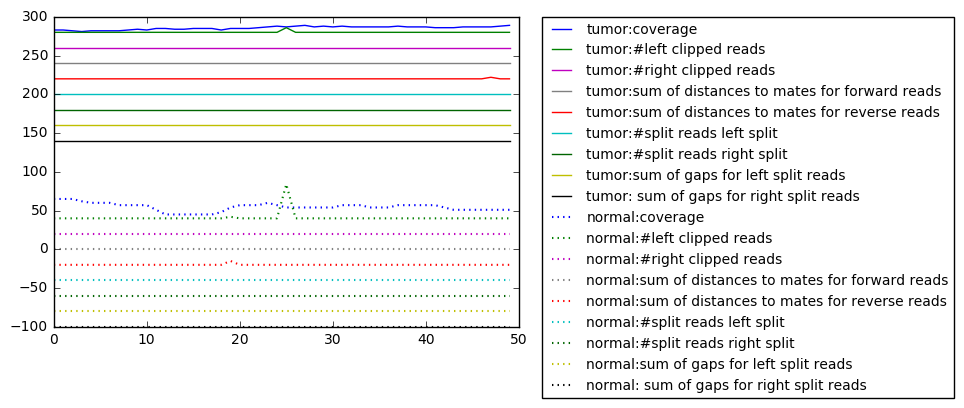

Manta:  del_end
DeepSV: ins_pos
id: 3


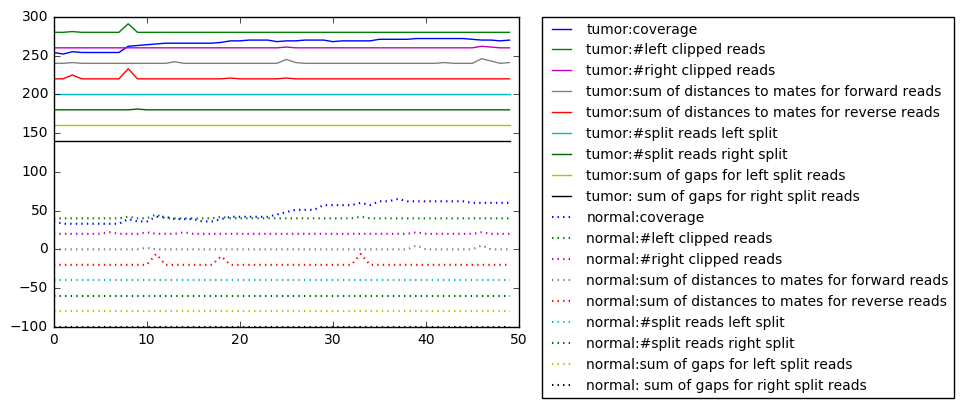

Manta:  del_start
DeepSV: ins_pos
id: 6


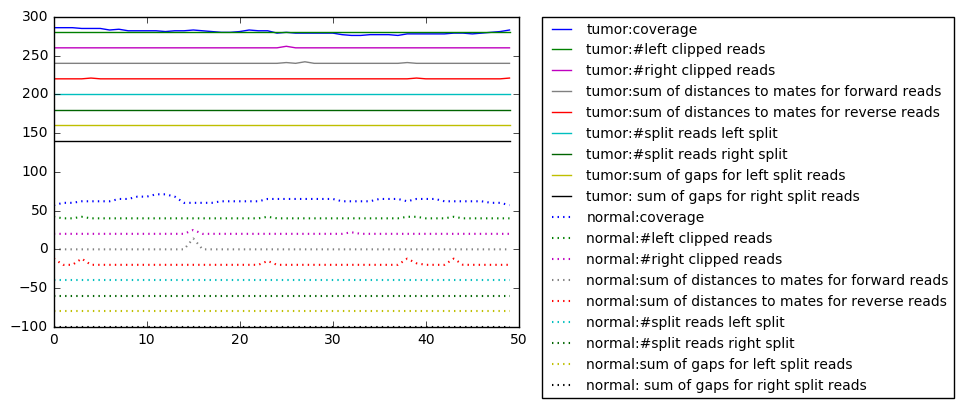

Manta:  del_end
DeepSV: ins_pos
id: 9


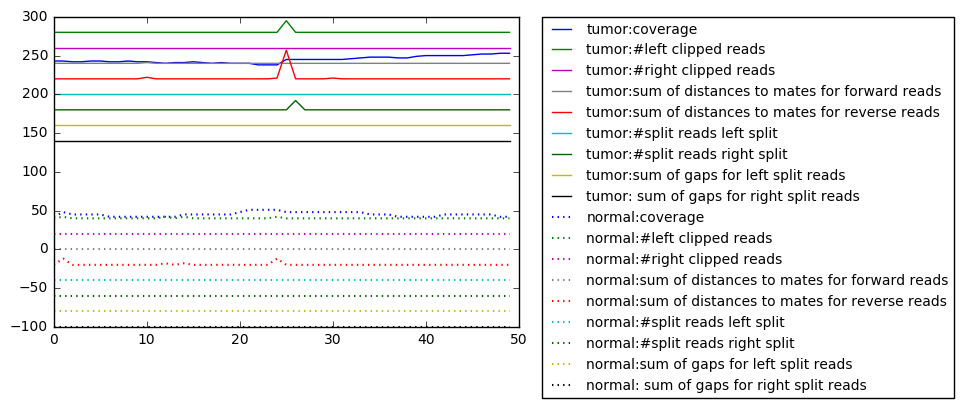

Manta:  del_end
DeepSV: ins_pos
id: 12


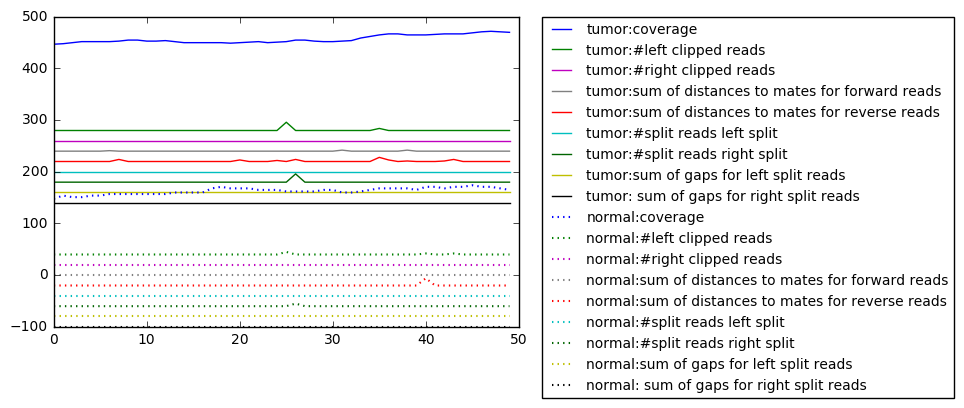

Manta:  del_start
DeepSV: del_start
id: 15


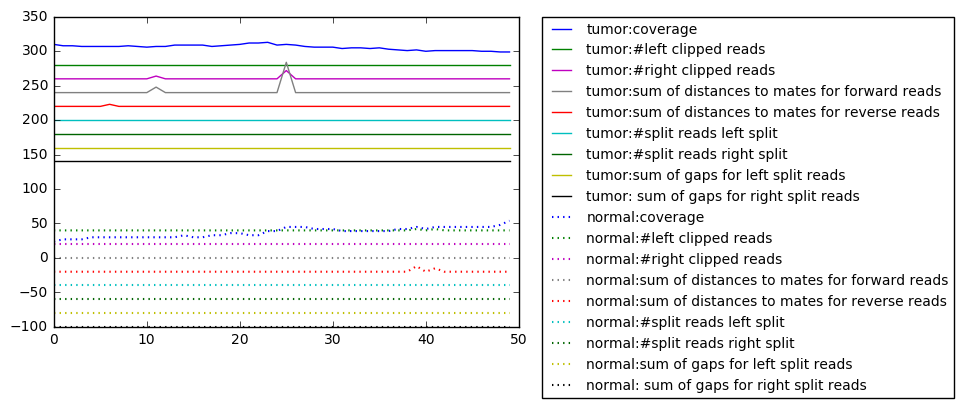

Manta:  del_end
DeepSV: ins_pos
id: 18


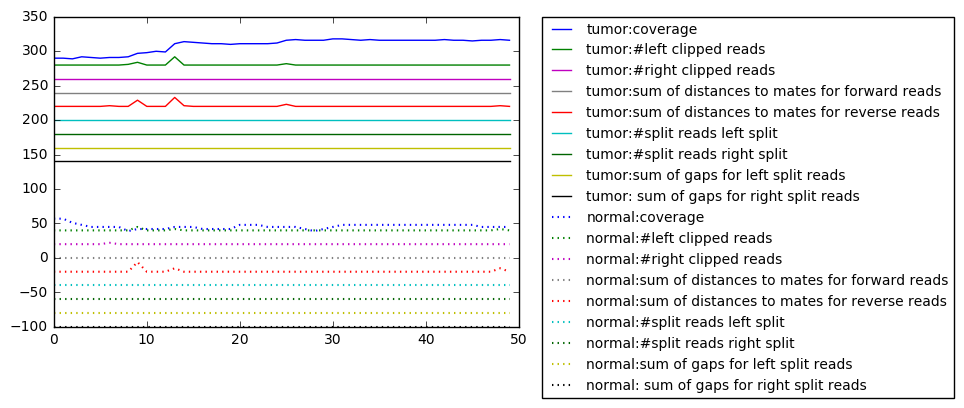

Manta:  del_end
DeepSV: ins_pos
id: 21


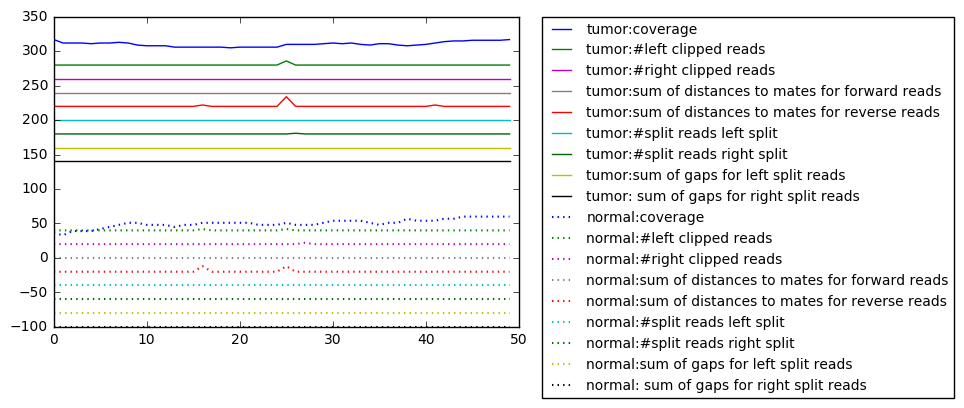

Manta:  del_start
DeepSV: del_start
id: 24


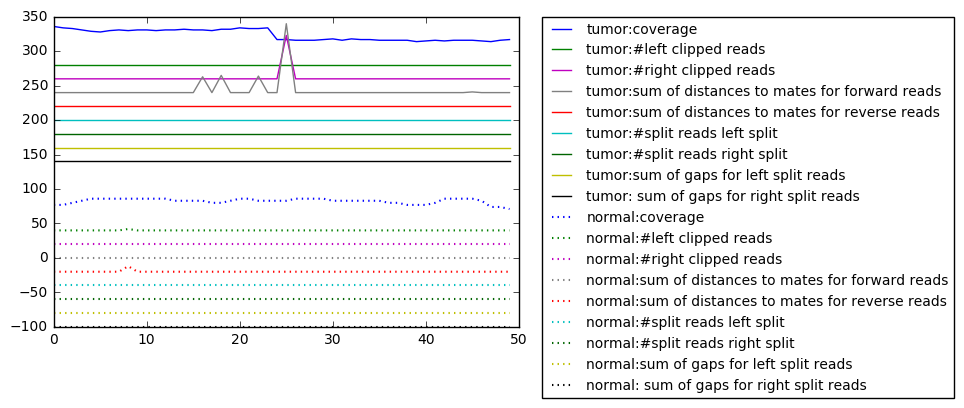

Manta:  del_start
DeepSV: ins_pos
id: 27


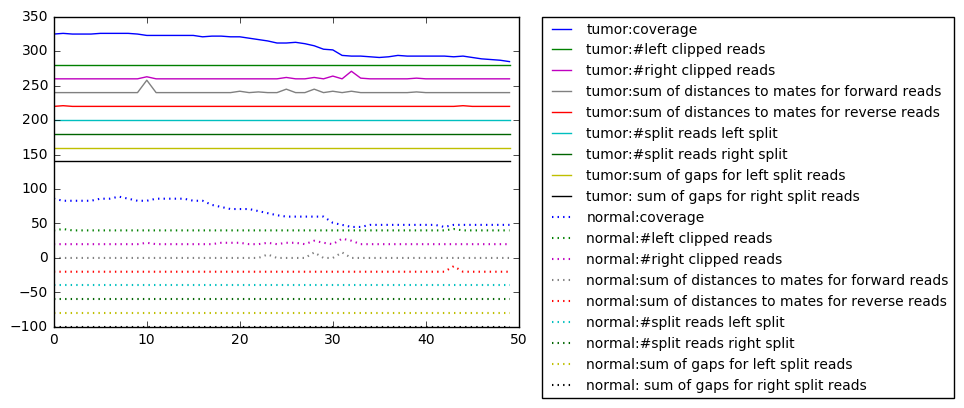

Manta:  del_start
DeepSV: ins_pos
id: 30


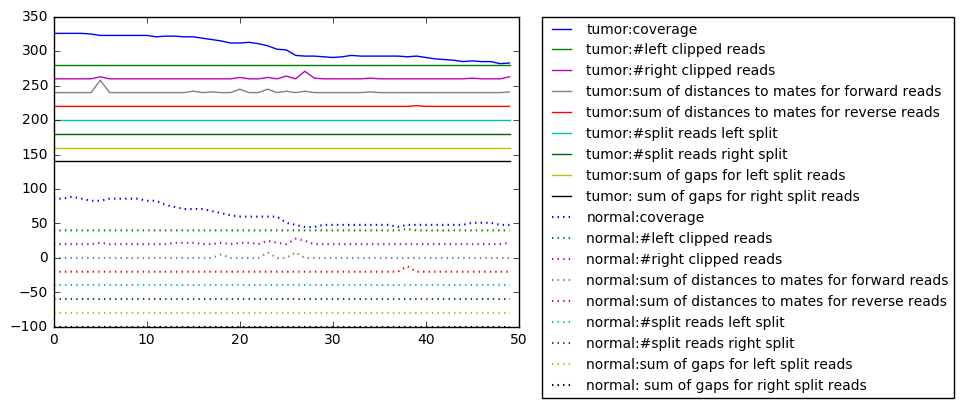

Manta:  del_end
DeepSV: del_start
id: 33


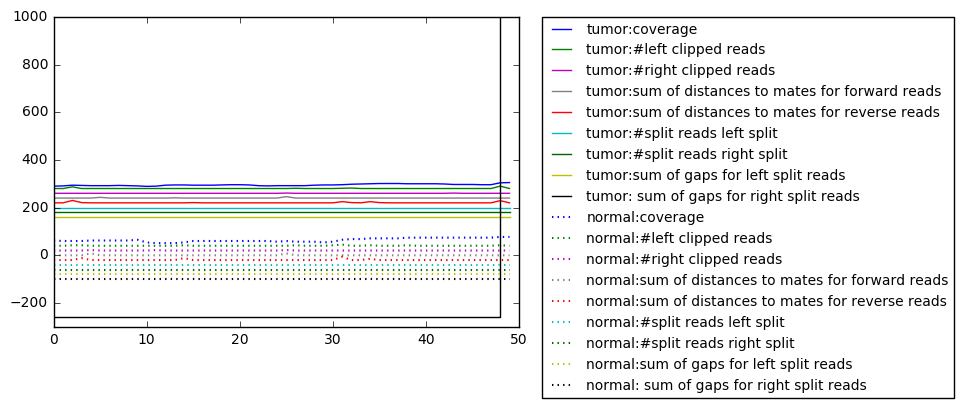

Manta:  del_start
DeepSV: ins_pos
id: 36


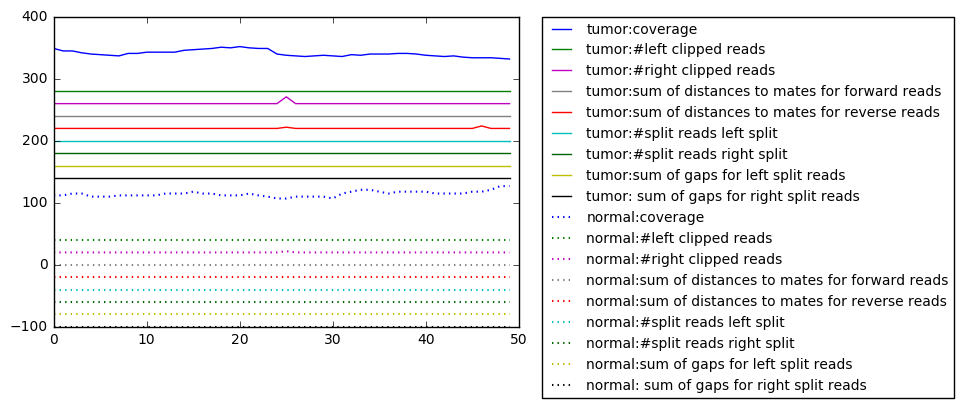

Manta:  del_start
DeepSV: ins_pos
id: 39


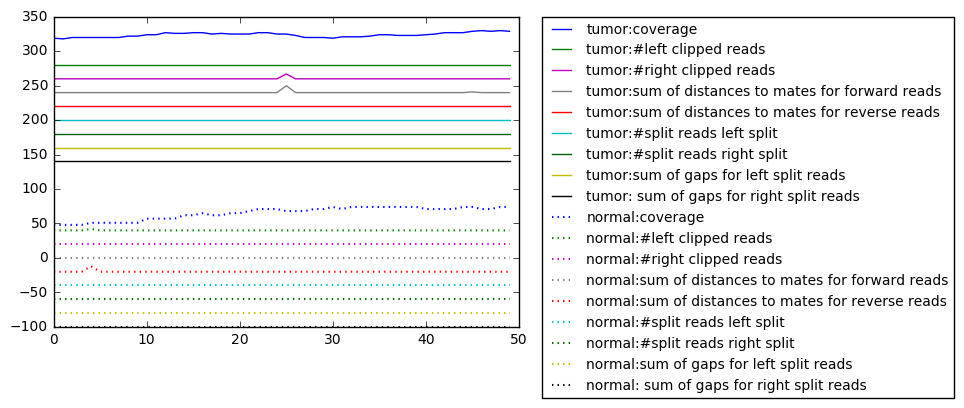

Manta:  del_end
DeepSV: ins_pos
id: 42


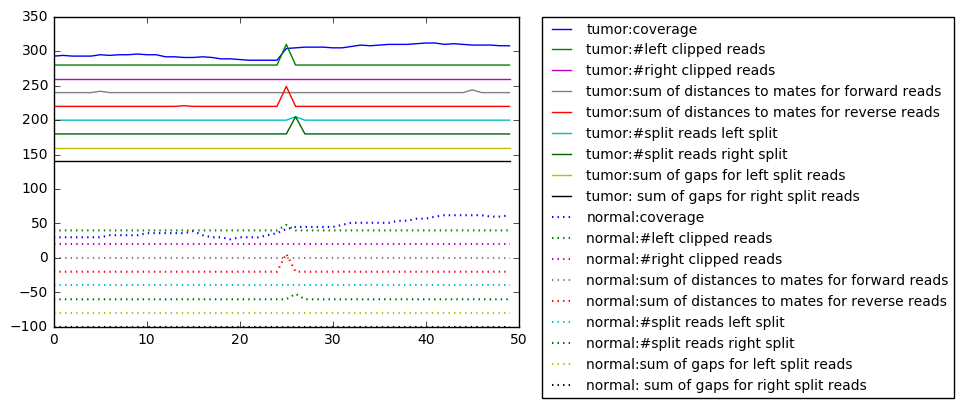

Manta:  del_end
DeepSV: ins_pos
id: 45


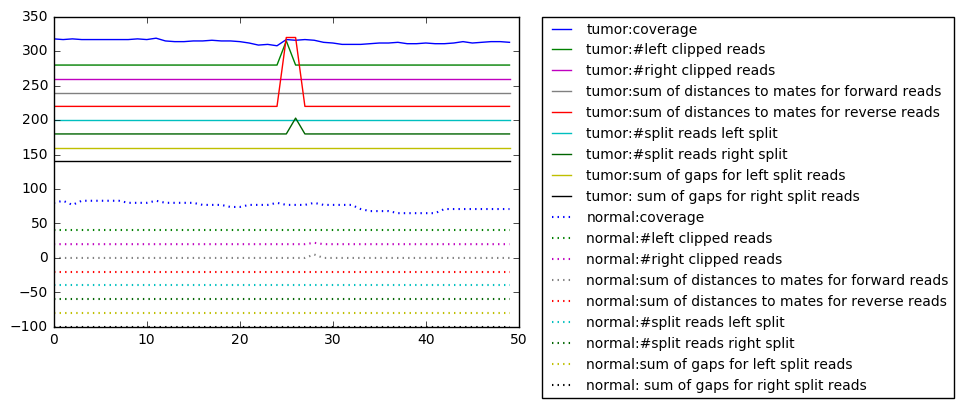

Manta:  del_start
DeepSV: ins_pos
id: 48


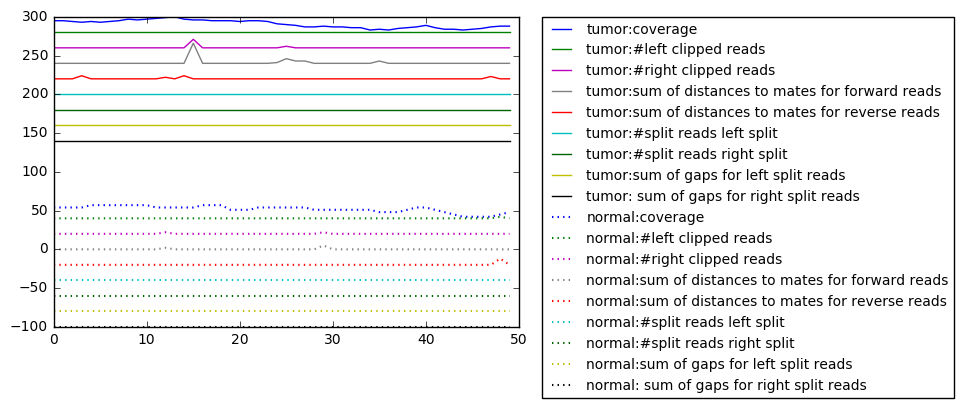

Manta:  del_end
DeepSV: del_end
id: 51


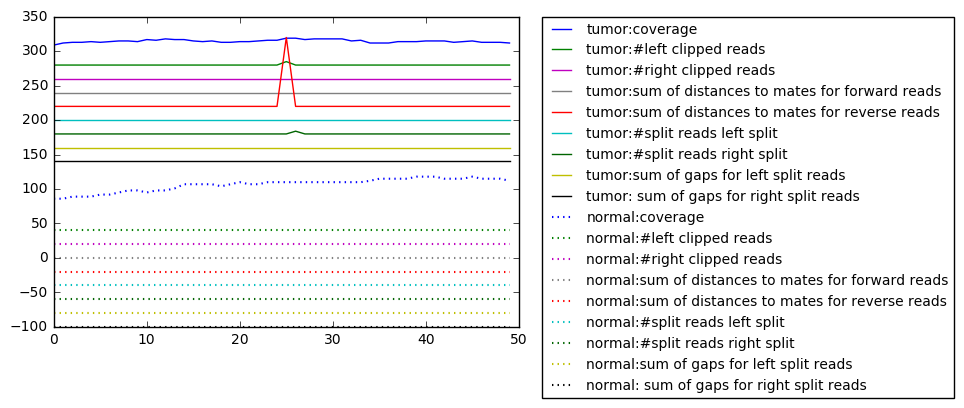

Manta:  del_end
DeepSV: ins_pos
id: 54


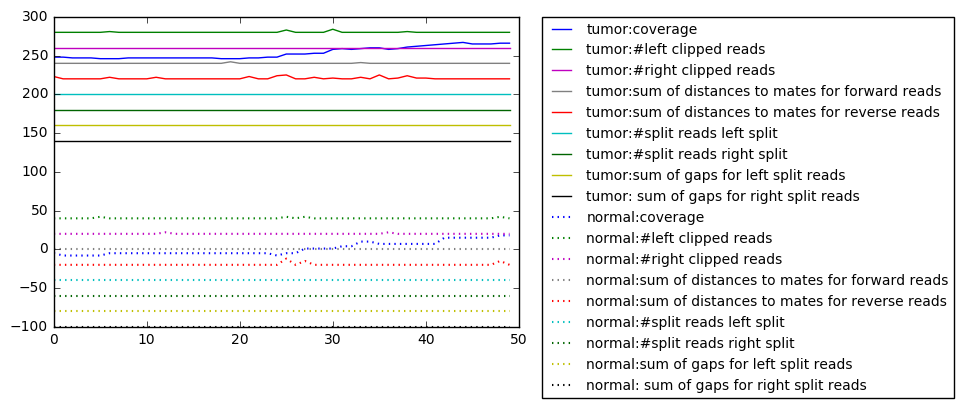

Manta:  del_start
DeepSV: ins_pos
id: 57


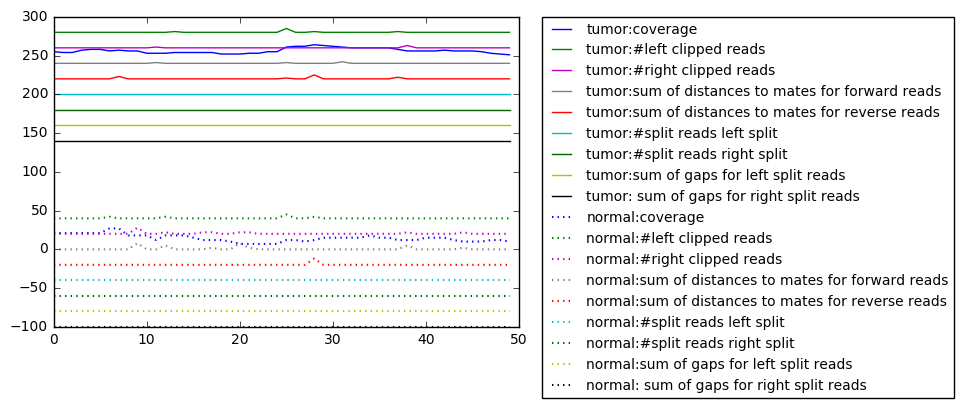

Manta:  del_end
DeepSV: del_start
id: 60


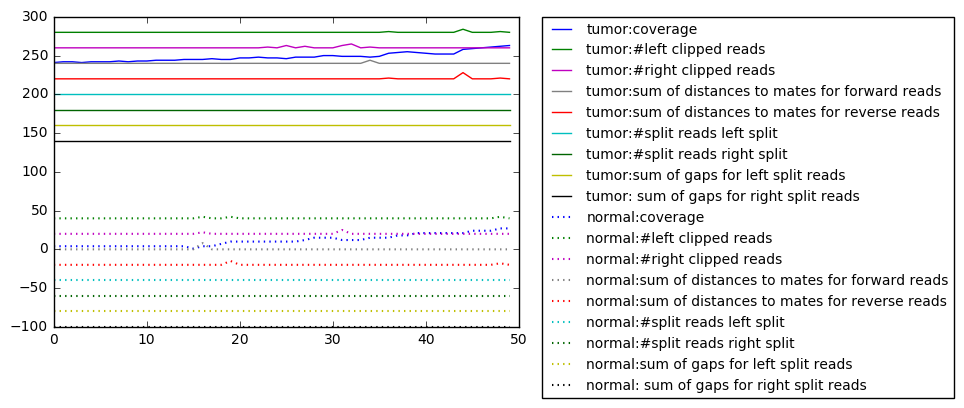

Manta:  del_start
DeepSV: del_start
id: 63


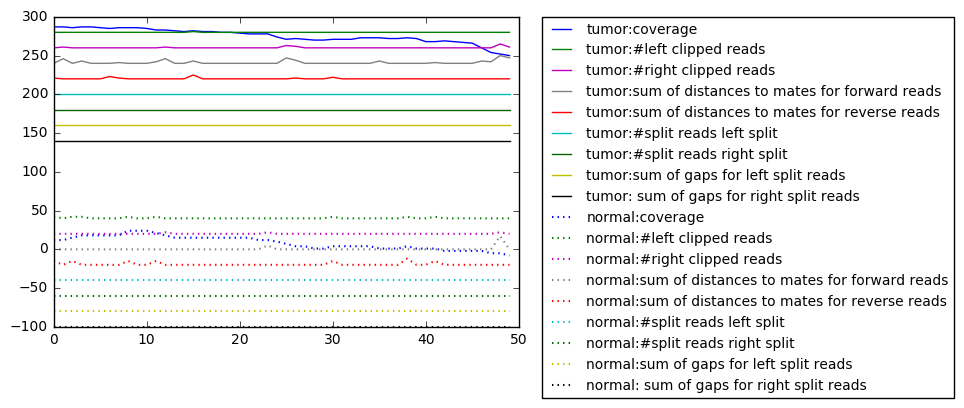

Manta:  del_start
DeepSV: ins_pos
id: 66


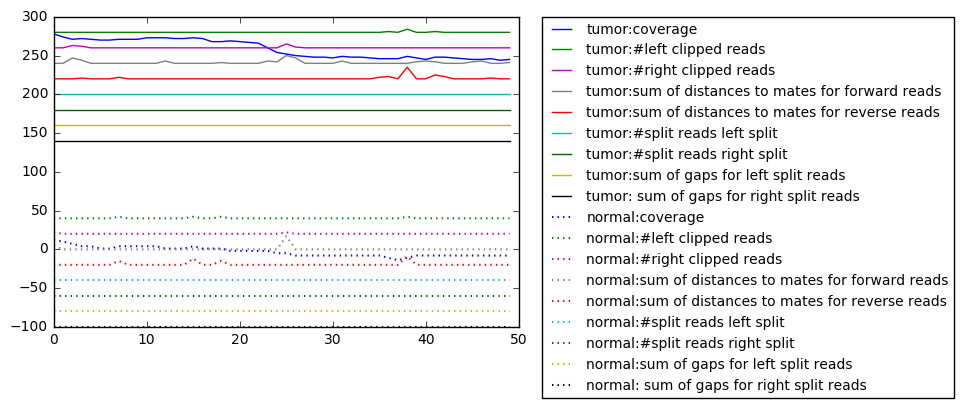

Manta:  del_start
DeepSV: ins_pos
id: 69


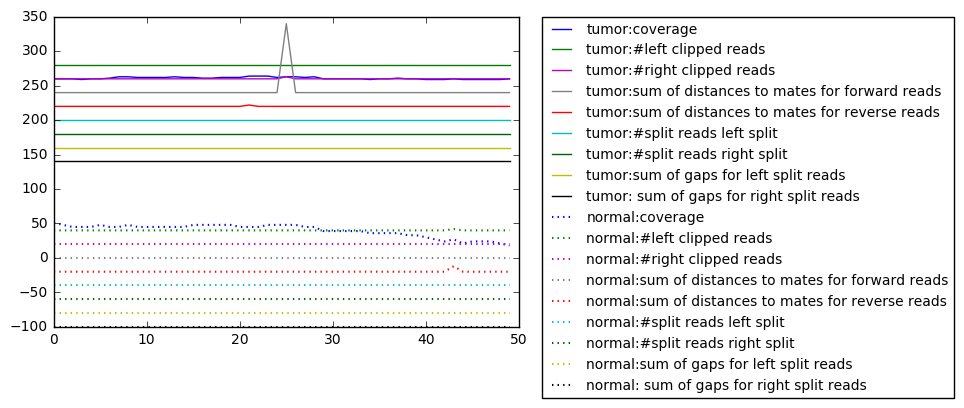

Manta:  del_end
DeepSV: del_end
id: 72


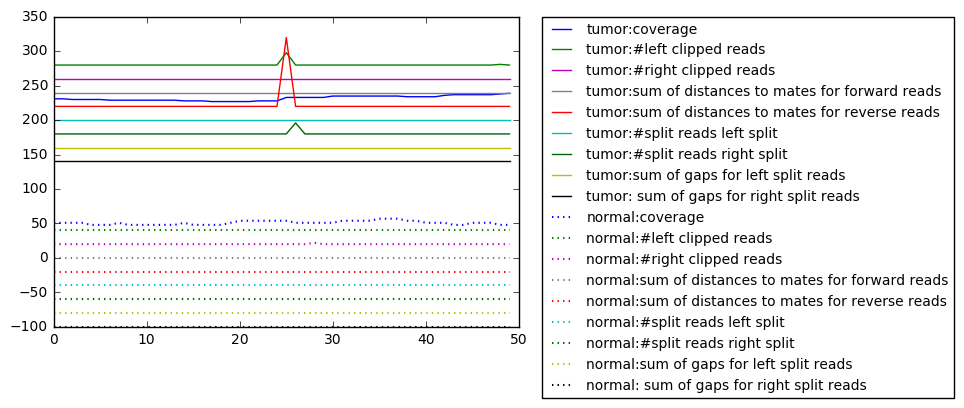

Manta:  del_end
DeepSV: ins_pos
id: 75


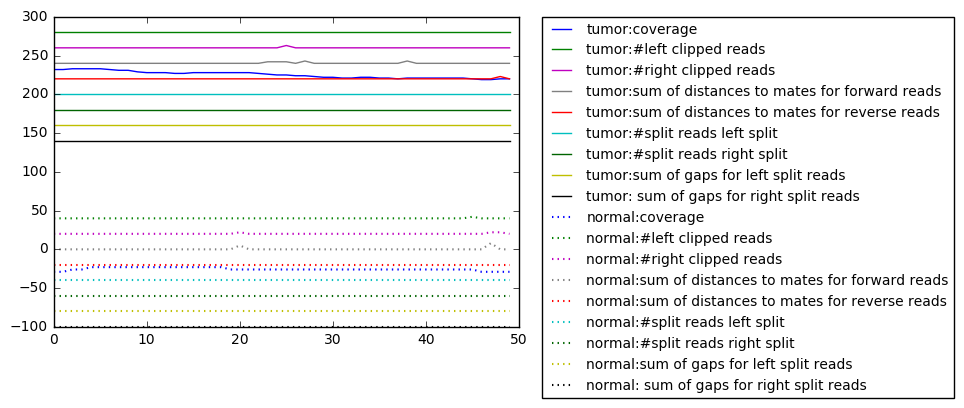

Manta:  del_end
DeepSV: ins_pos
id: 78


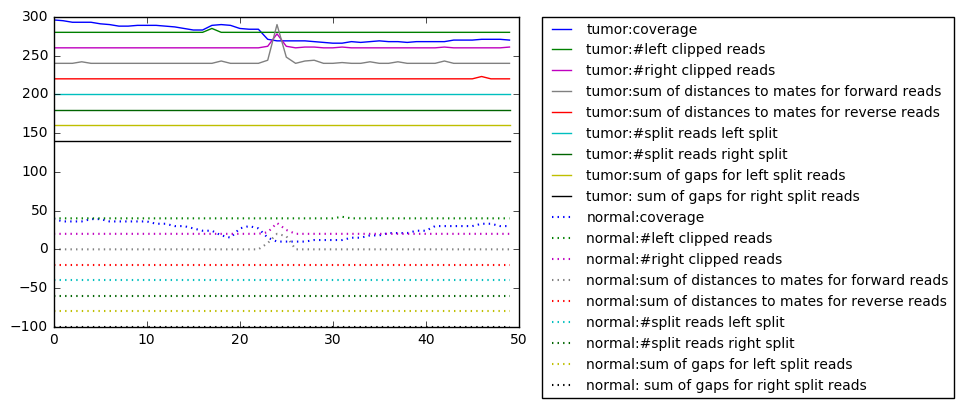

Manta:  del_start
DeepSV: ins_pos
id: 81


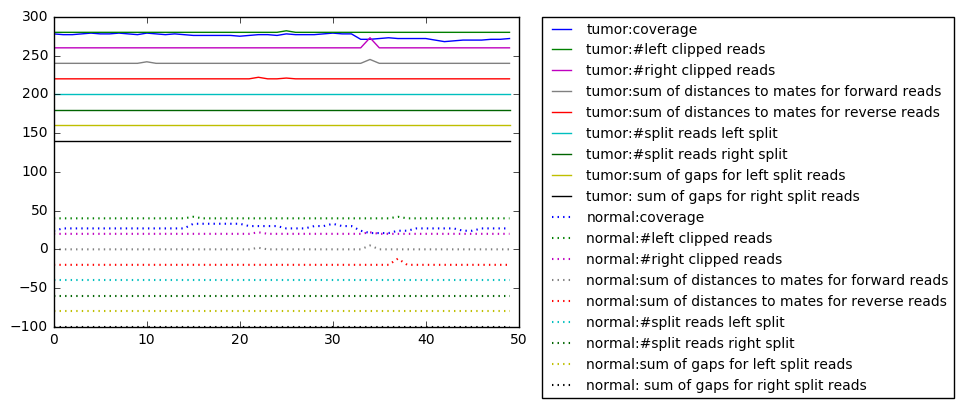

Manta:  del_end
DeepSV: del_start
id: 84


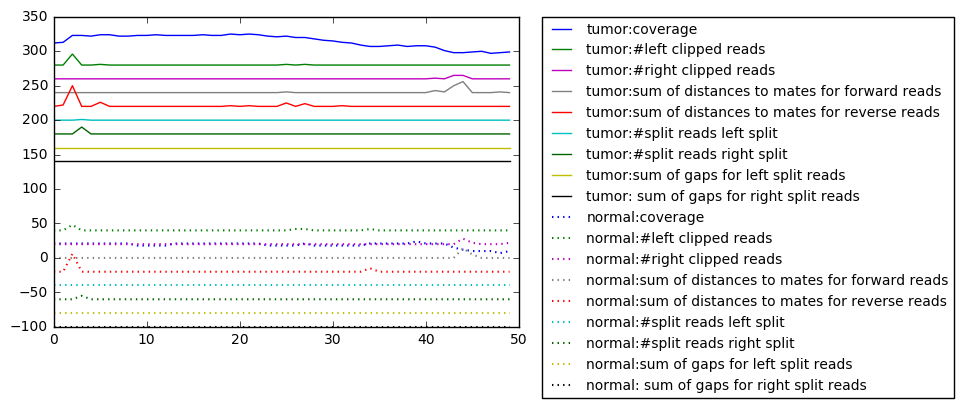

Manta:  del_end
DeepSV: ins_pos
id: 87


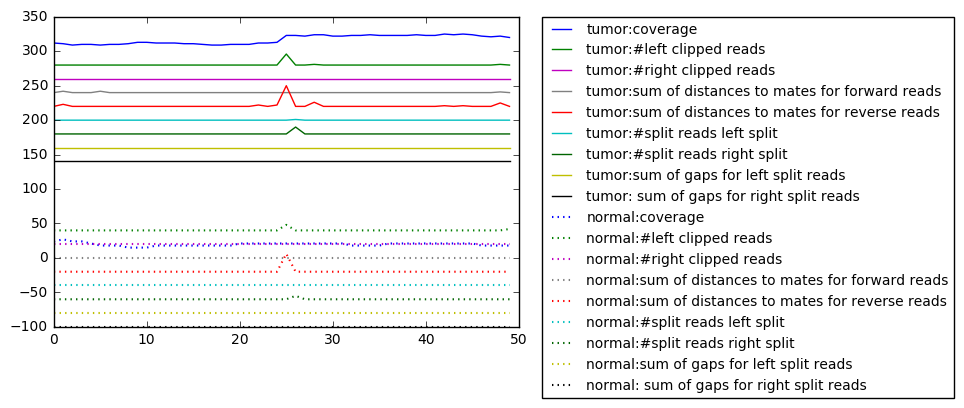

Manta:  del_start
DeepSV: del_start
id: 90


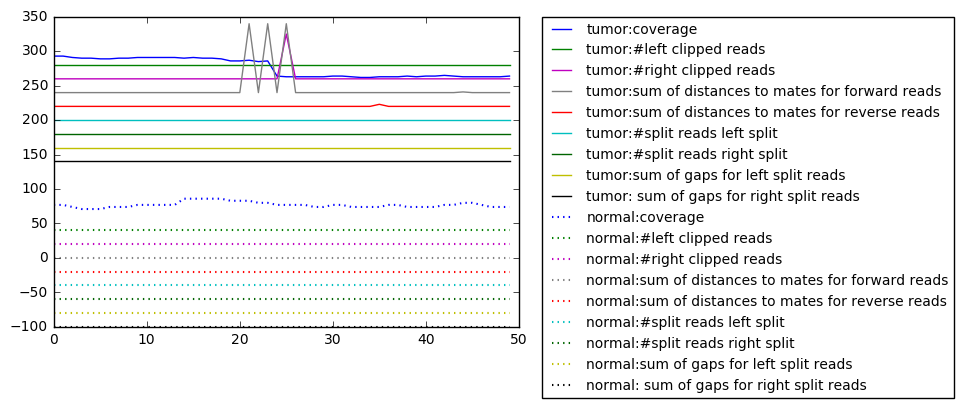

Manta:  del_end
DeepSV: del_end
id: 93


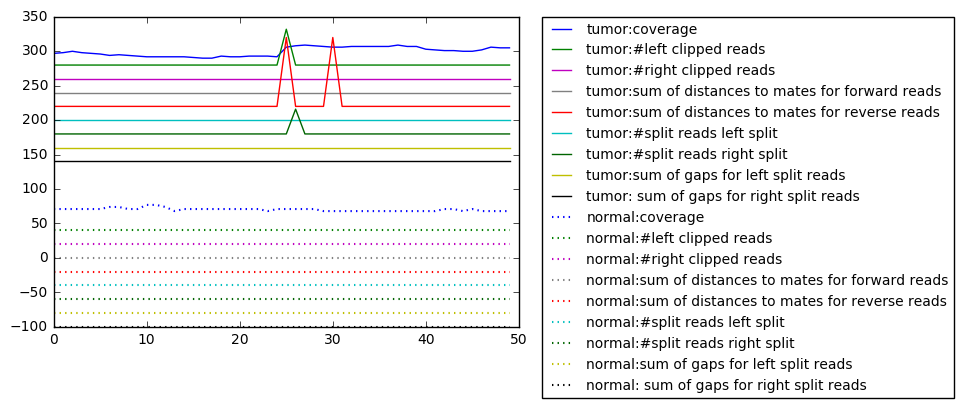

Manta:  del_start
DeepSV: ins_pos
id: 96


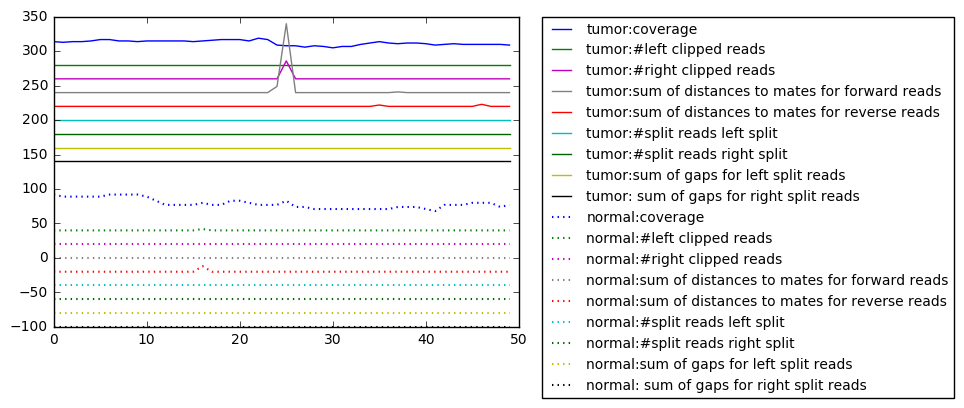

Manta:  del_start
DeepSV: ins_pos
id: 99


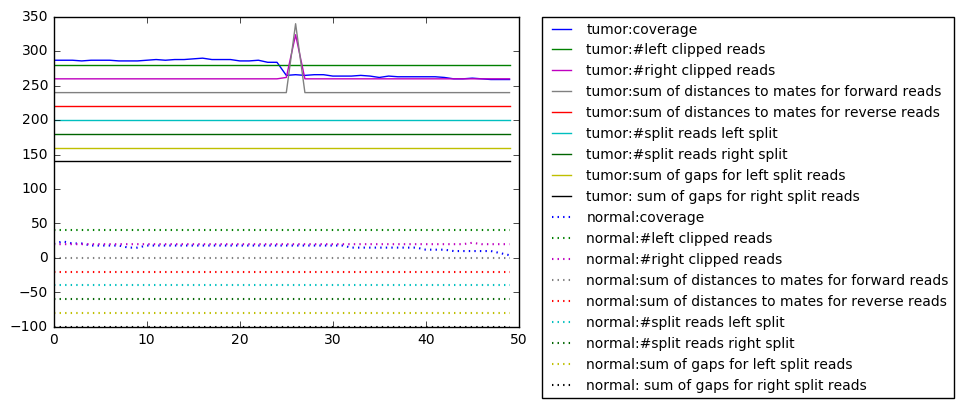

Manta:  del_start
DeepSV: ins_pos
id: 102


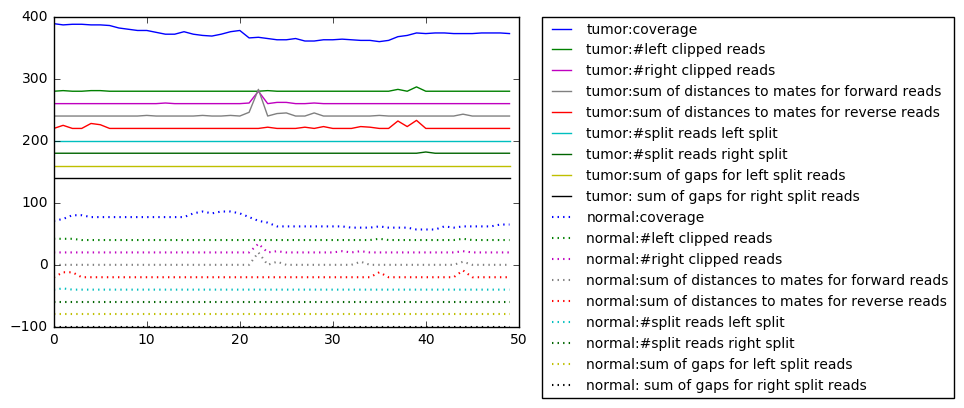

Manta:  del_start
DeepSV: ins_pos
id: 105


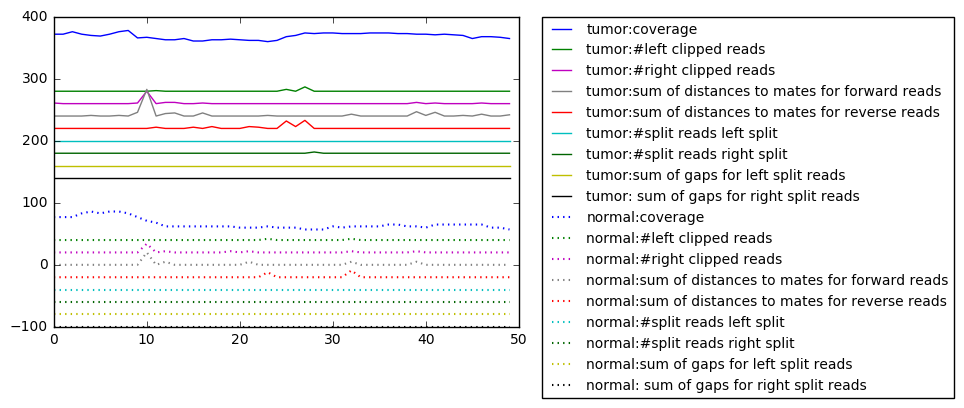

Manta:  del_end
DeepSV: del_end
id: 108


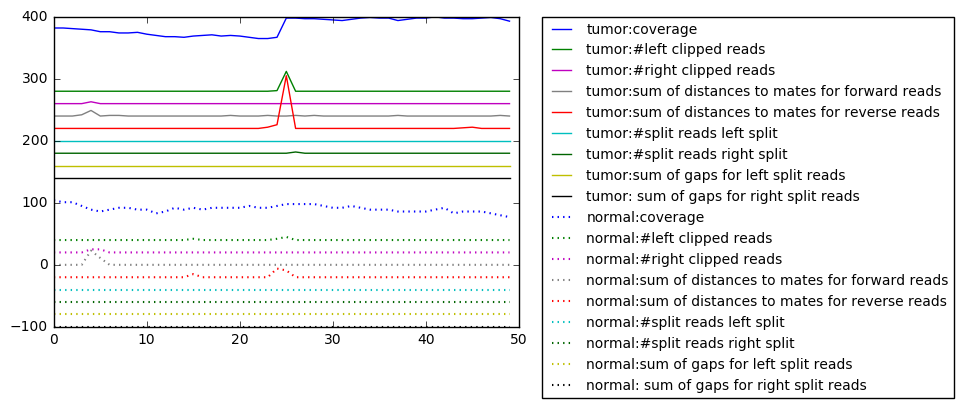

Manta:  del_start
DeepSV: ins_pos
id: 111


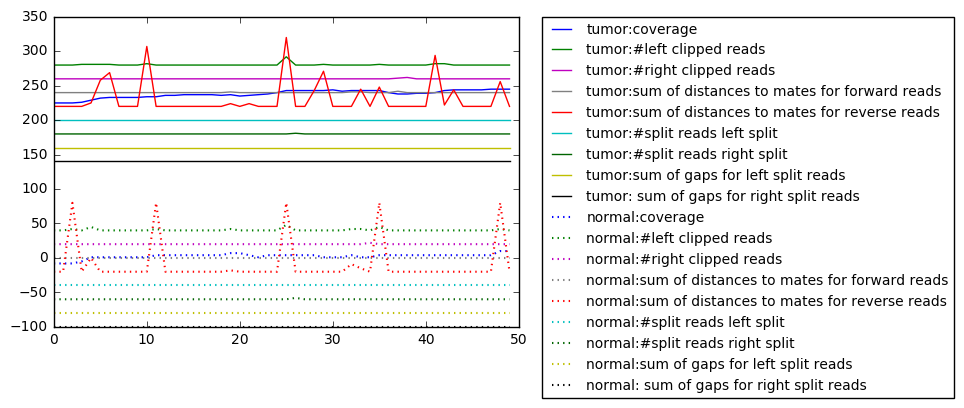

Manta:  del_end
DeepSV: ins_pos
id: 114


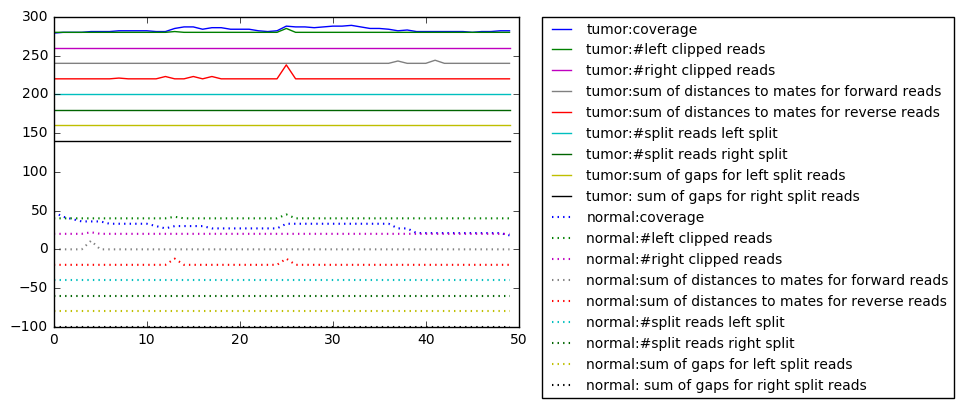

Manta:  del_end
DeepSV: del_end
id: 117


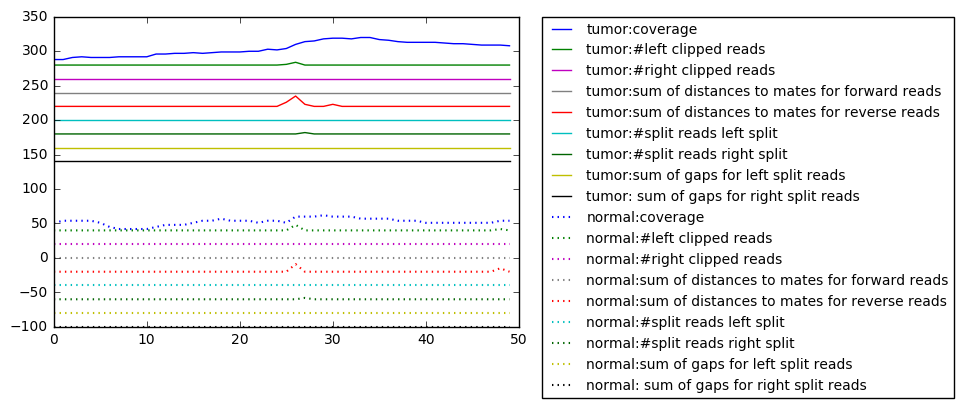

Manta:  del_end
DeepSV: ins_pos
id: 120


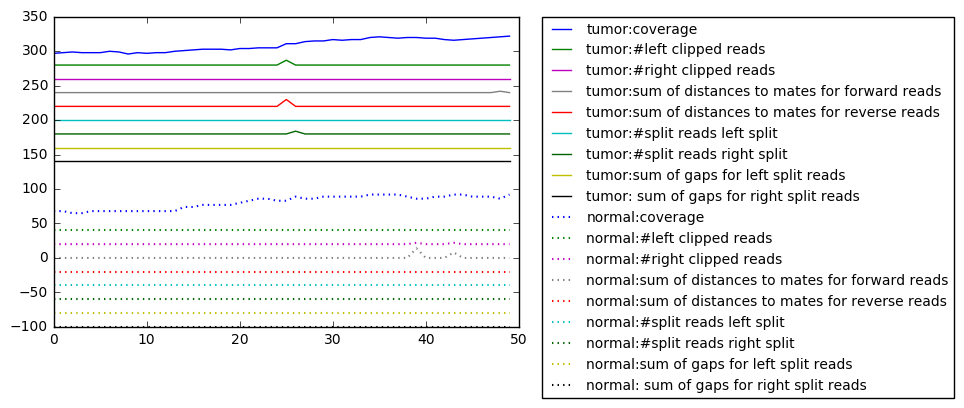

Manta:  del_start
DeepSV: ins_pos
id: 123


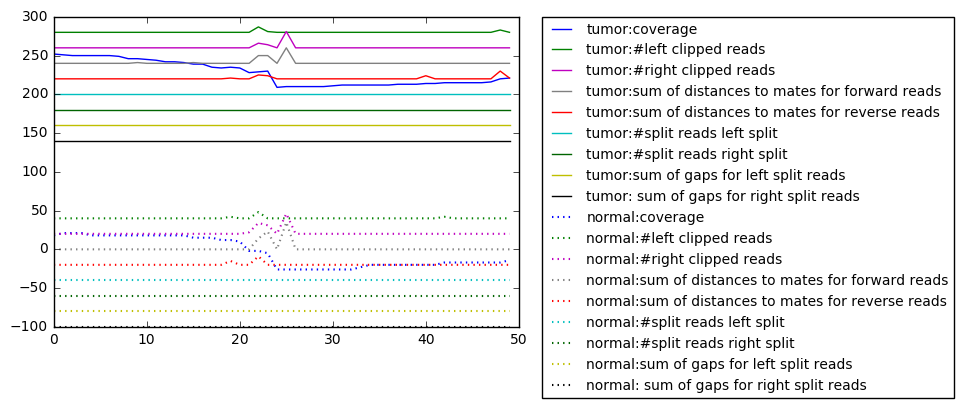

Manta:  del_end
DeepSV: del_end
id: 126


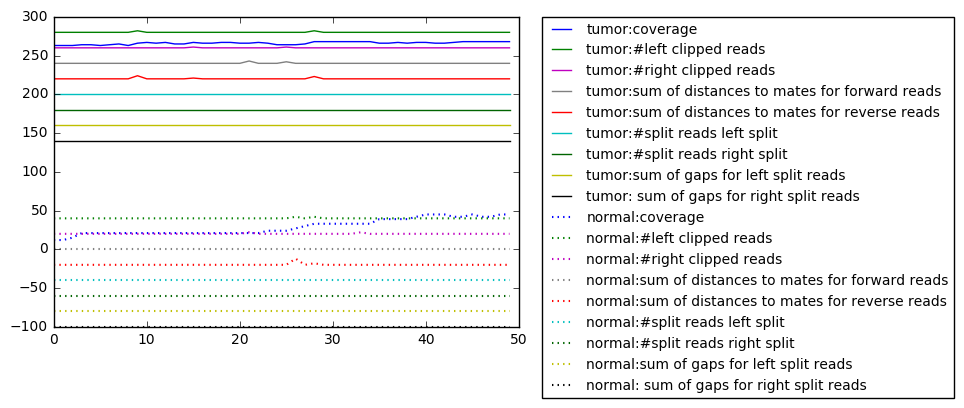

Manta:  del_end
DeepSV: ins_pos
id: 129


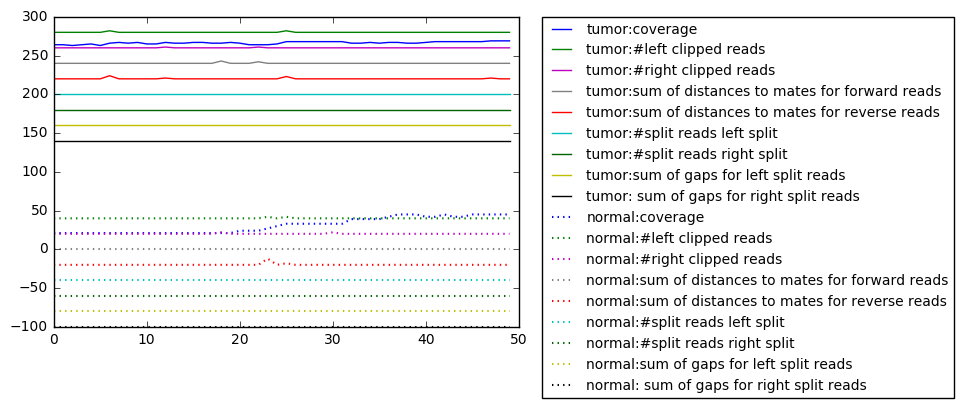

Manta:  del_start
DeepSV: ins_pos
id: 132


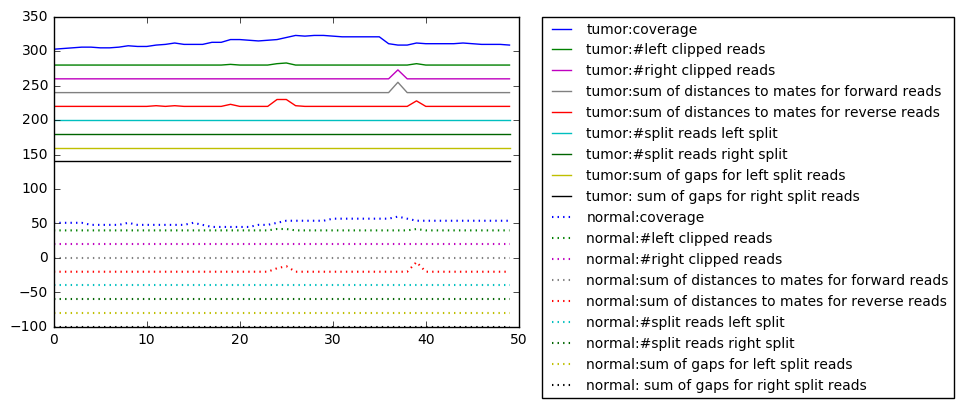

Manta:  del_start
DeepSV: ins_pos
id: 135


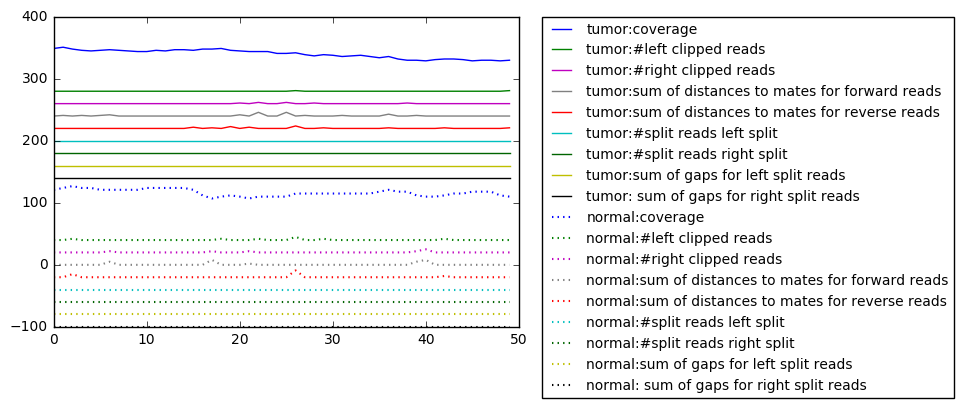

Manta:  del_end
DeepSV: ins_pos
id: 138


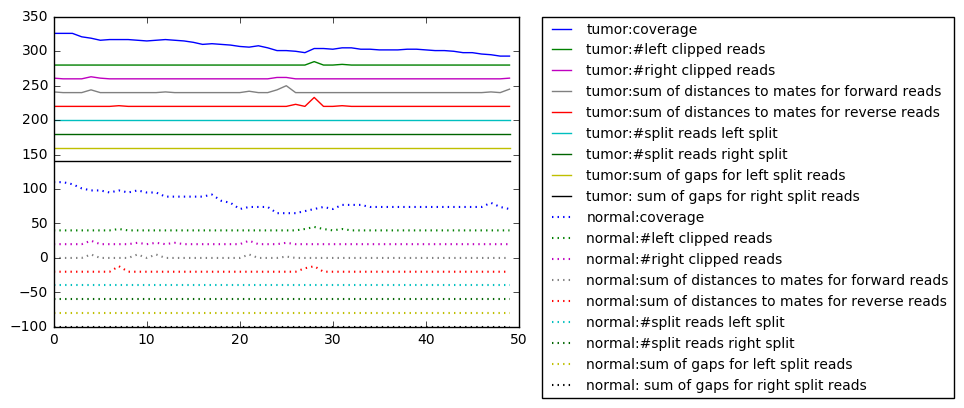

Manta:  del_end
DeepSV: ins_pos
id: 141


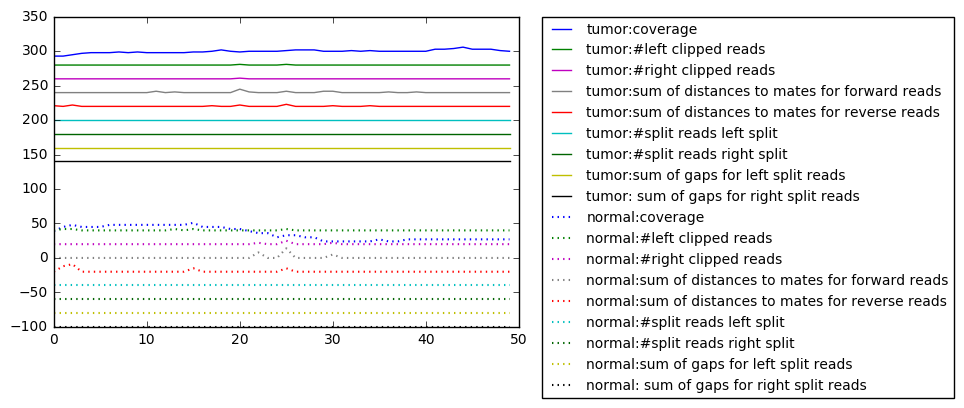

Manta:  del_start
DeepSV: del_start
id: 144


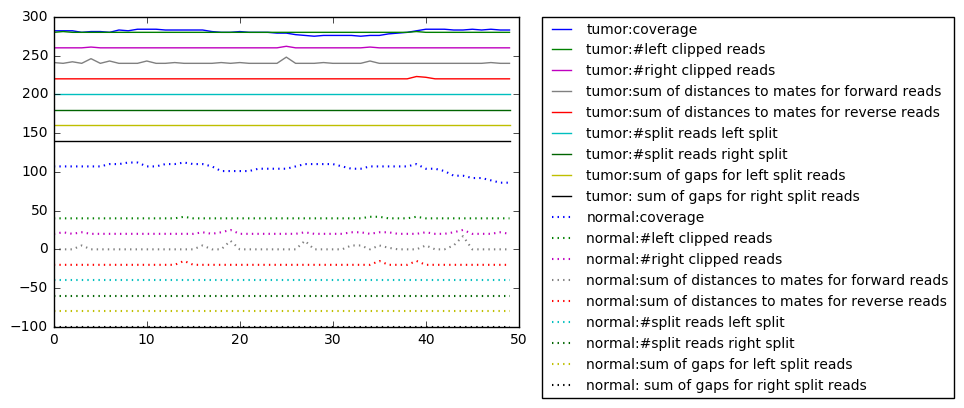

Manta:  del_end
DeepSV: ins_pos
id: 147


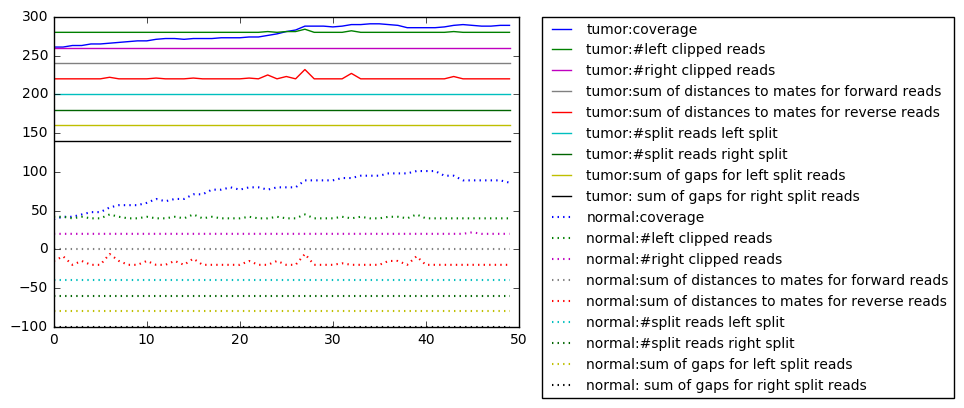

Manta:  del_start
DeepSV: ins_pos
id: 150


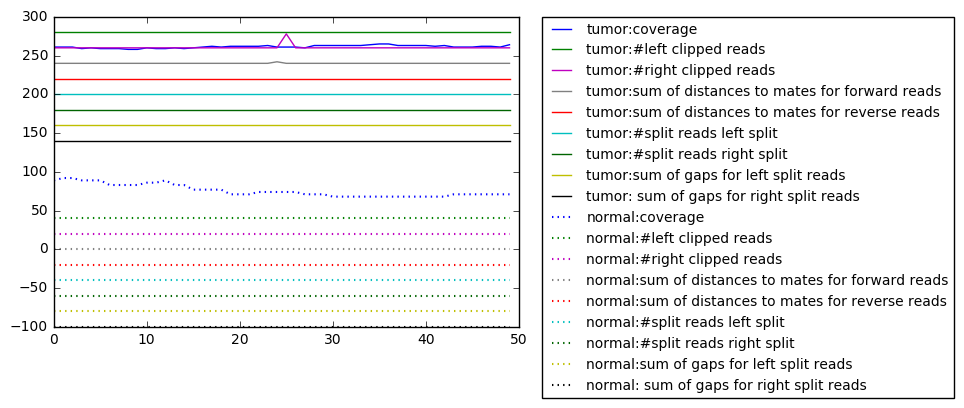

Manta:  del_start
DeepSV: del_start
id: 153


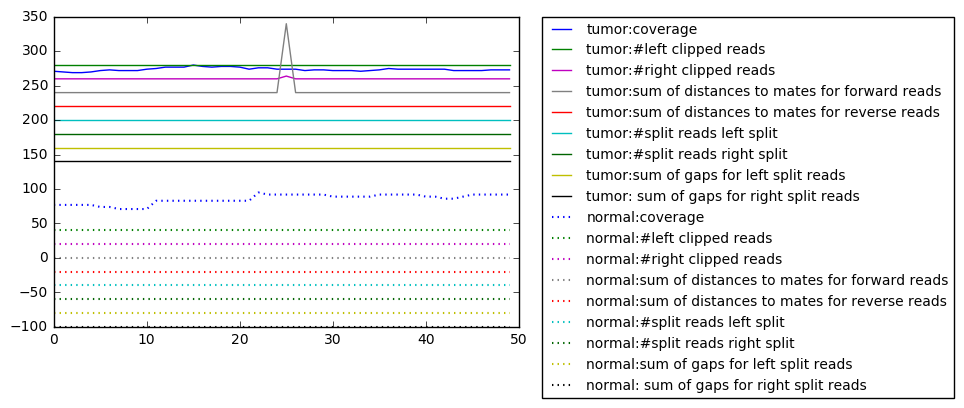

Manta:  del_end
DeepSV: ins_pos
id: 156


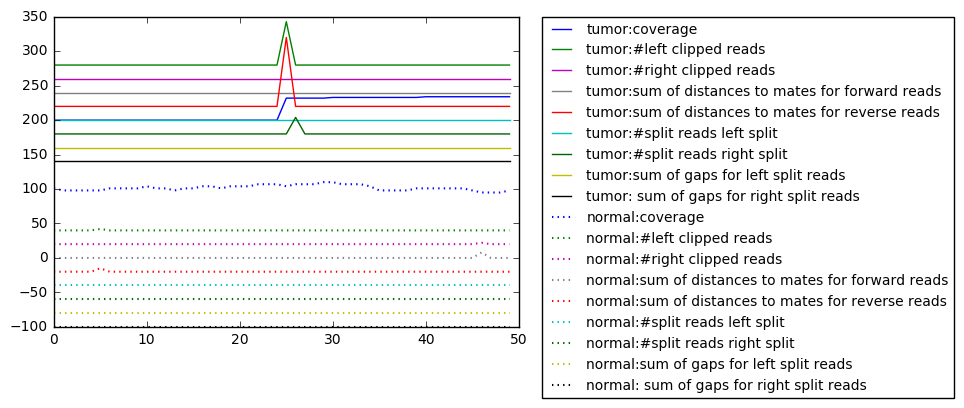

Manta:  del_end
DeepSV: del_end
id: 159


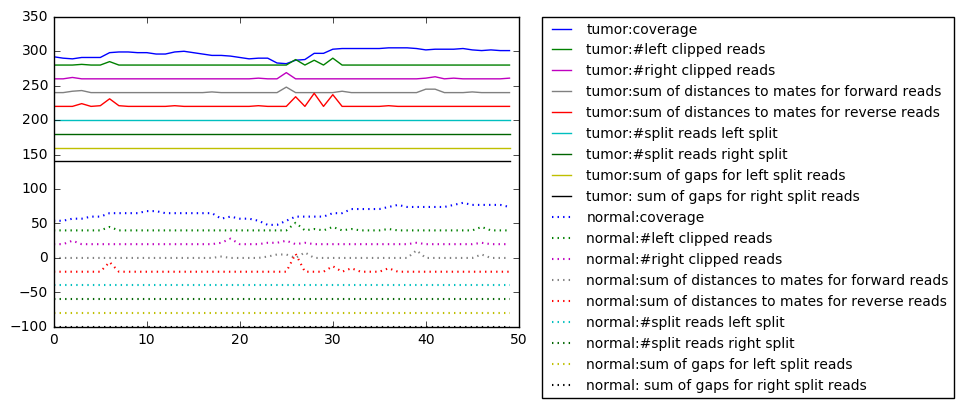

Manta:  del_end
DeepSV: ins_pos
id: 162


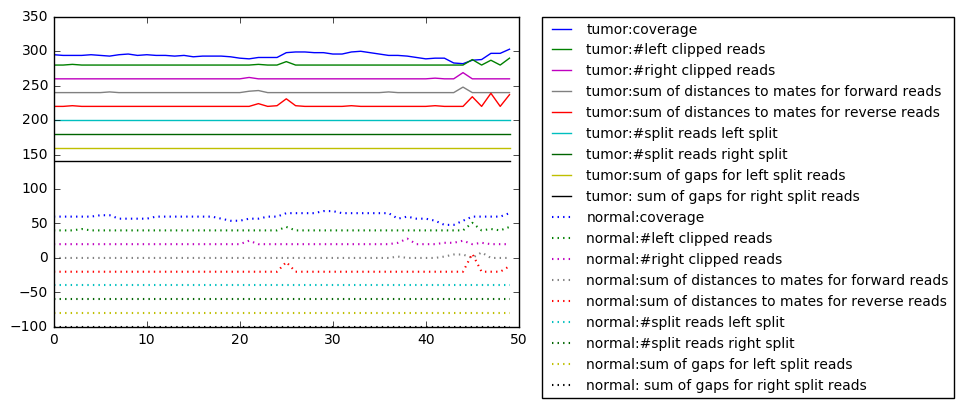

Manta:  del_end
DeepSV: ins_pos
id: 165


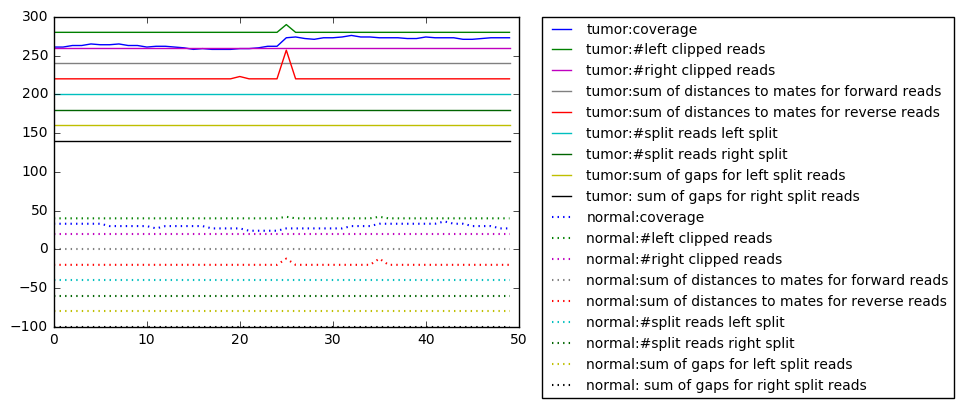

Manta:  del_start
DeepSV: ins_pos
id: 168


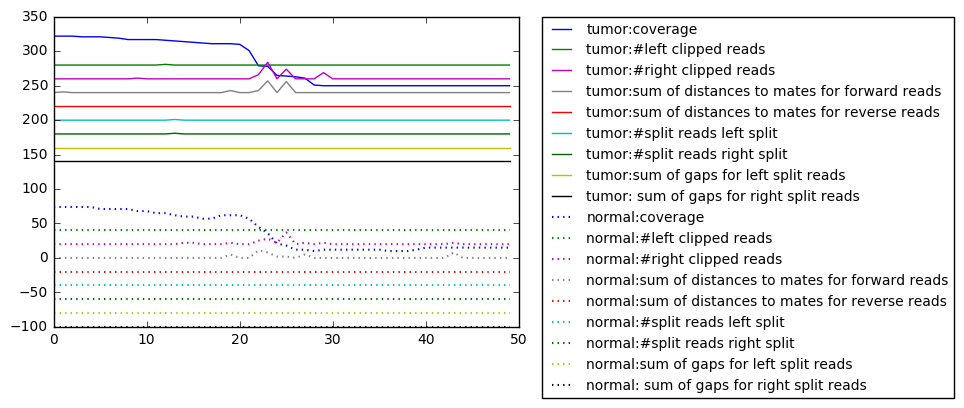

Manta:  del_start
DeepSV: ins_pos
id: 171


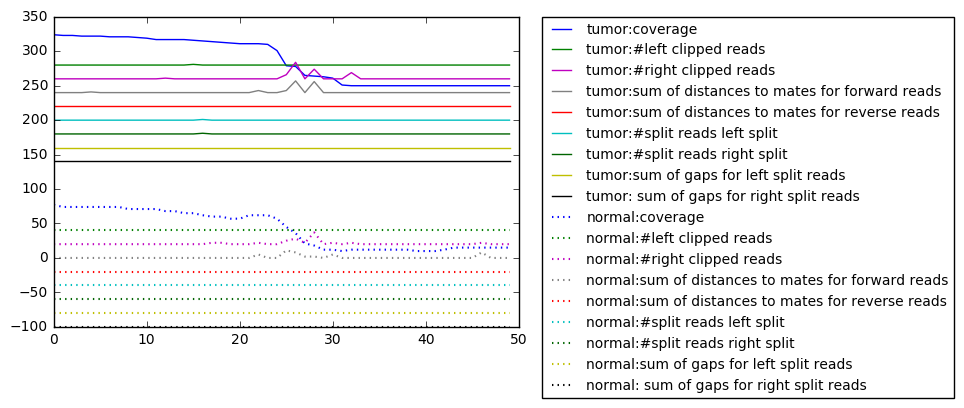

Manta:  del_end
DeepSV: ins_pos
id: 174


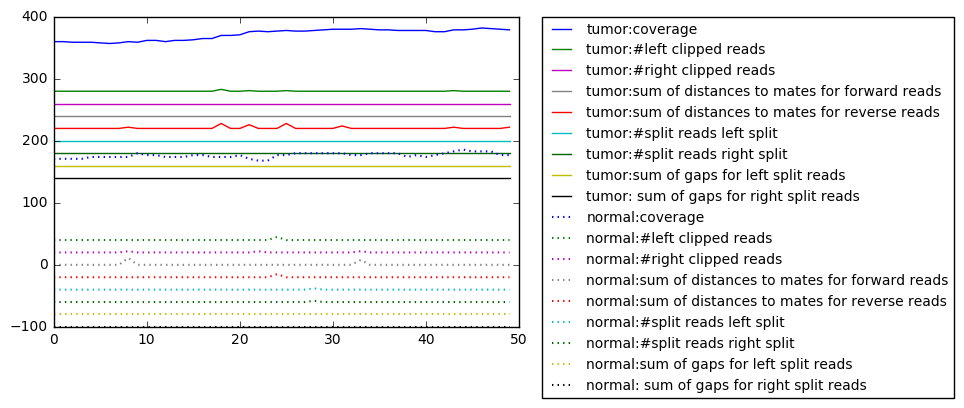

Manta:  del_start
DeepSV: ins_pos
id: 177


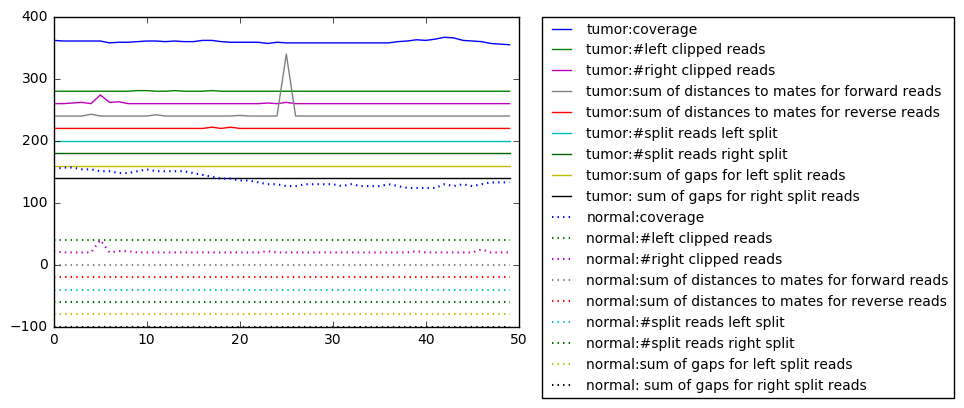

Manta:  del_start
DeepSV: ins_pos
id: 180


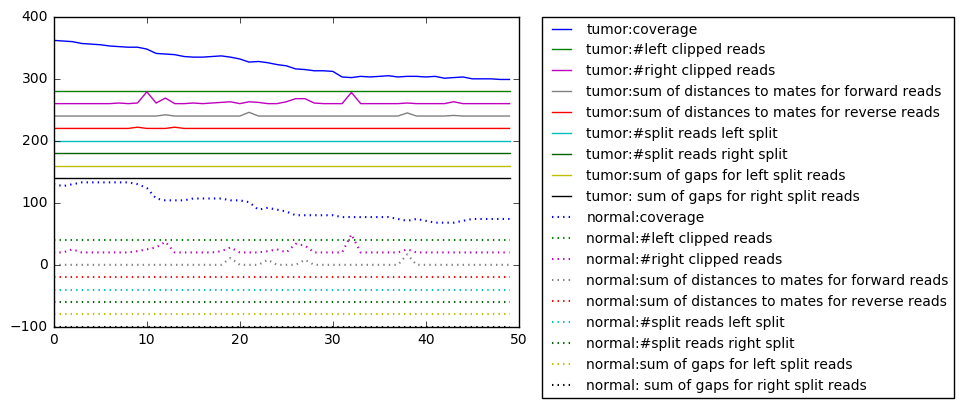

Manta:  del_start
DeepSV: ins_pos
id: 183


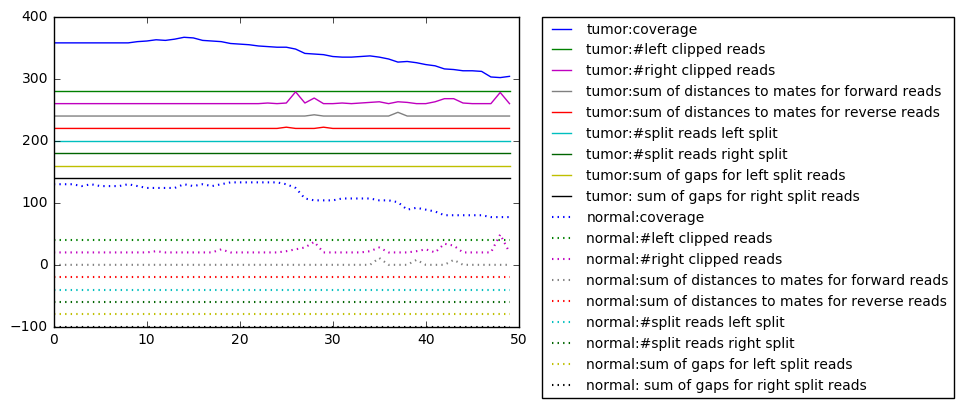

Manta:  del_start
DeepSV: del_start
id: 186


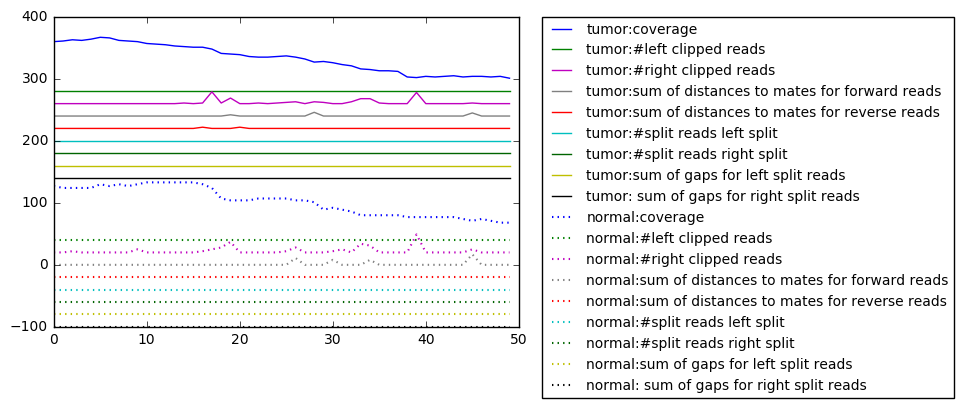

Manta:  del_end
DeepSV: ins_pos
id: 189


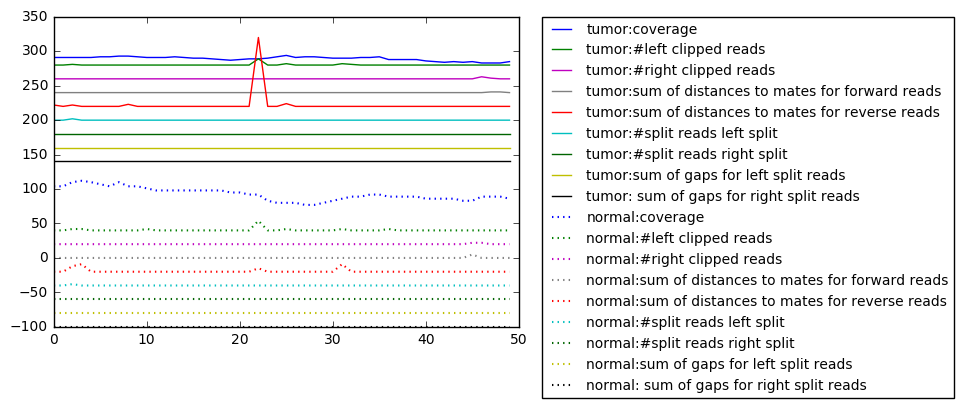

Manta:  del_end
DeepSV: ins_pos
id: 192


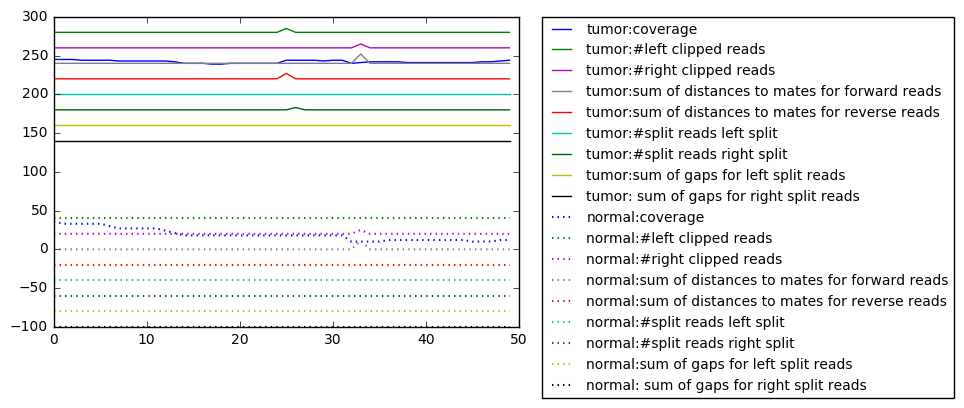

Manta:  del_start
DeepSV: ins_pos
id: 195


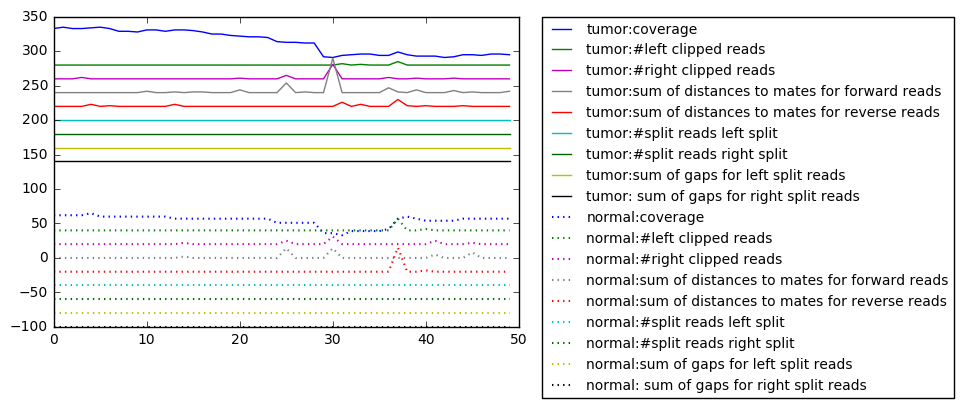

Manta:  del_end
DeepSV: ins_pos
id: 198


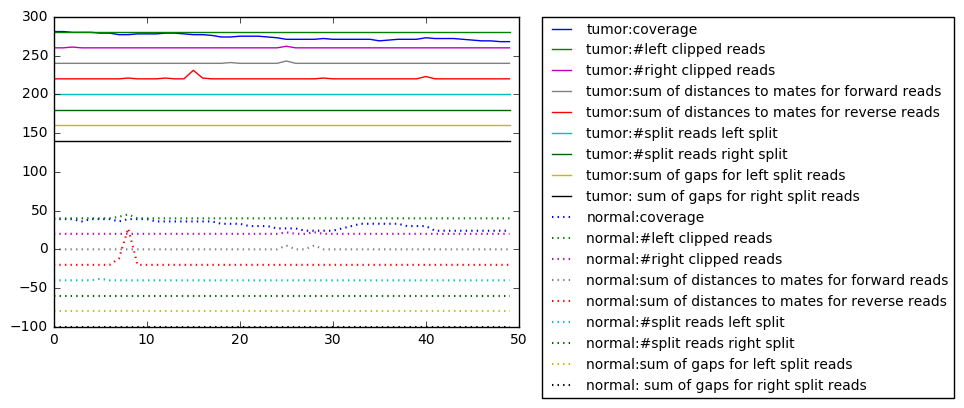

Manta:  del_start
DeepSV: ins_pos
id: 201


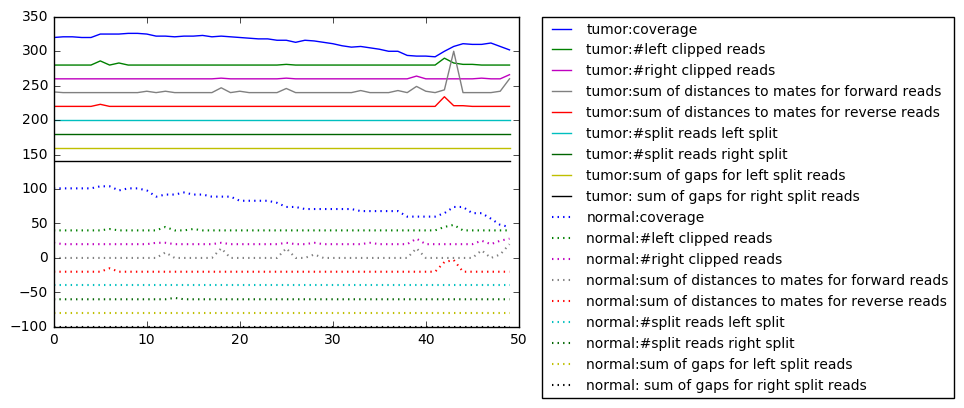

Manta:  del_start
DeepSV: ins_pos
id: 204


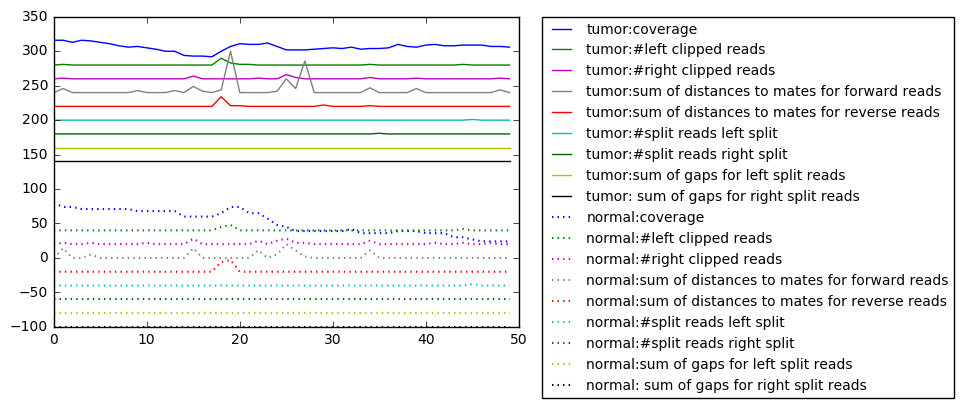

Manta:  del_end
DeepSV: ins_pos
id: 207


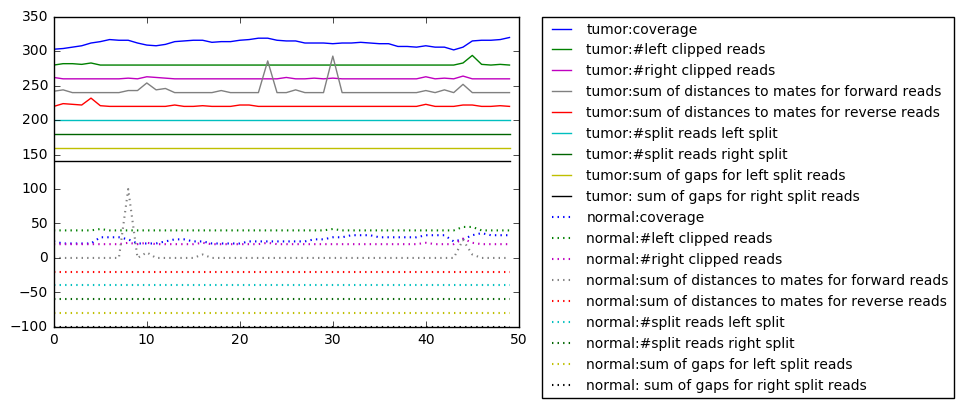

Manta:  del_start
DeepSV: ins_pos
id: 210


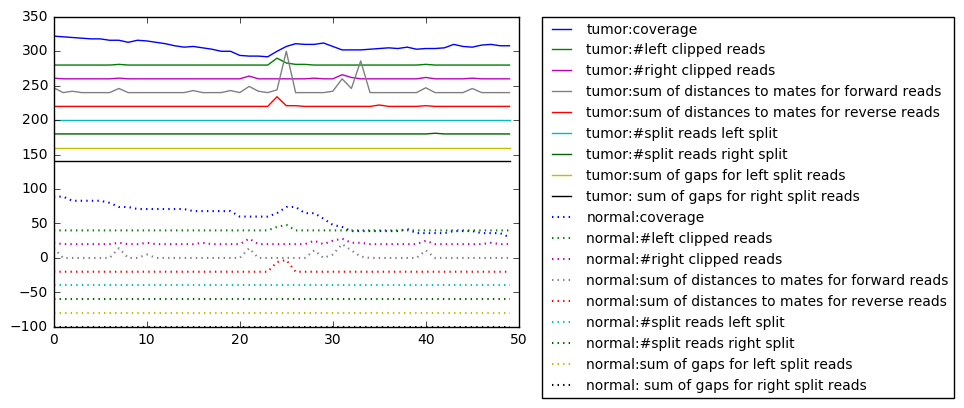

Manta:  del_end
DeepSV: ins_pos
id: 213


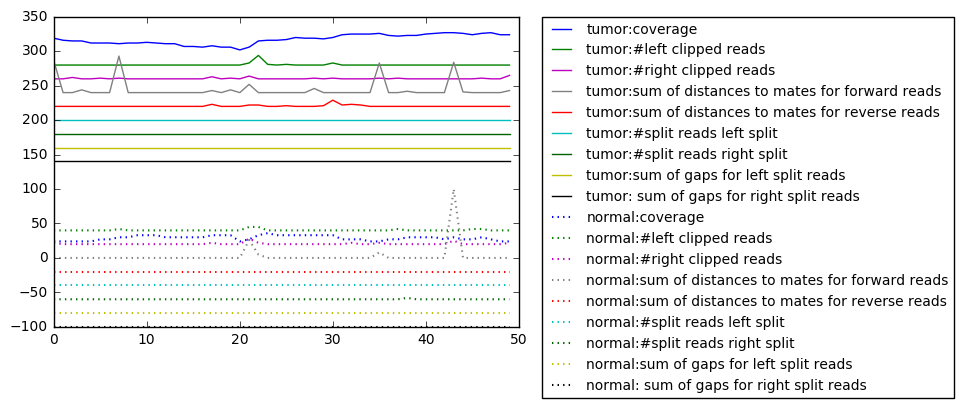

Manta:  del_start
DeepSV: del_start
id: 216


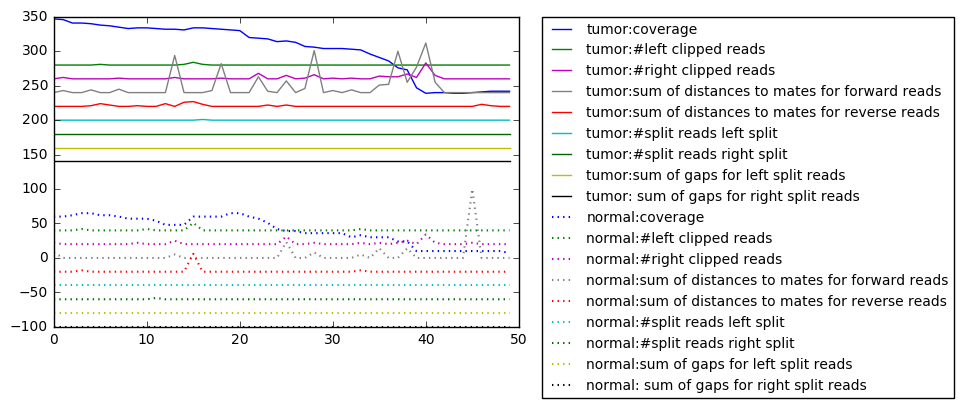

Manta:  del_start
DeepSV: ins_pos
id: 219


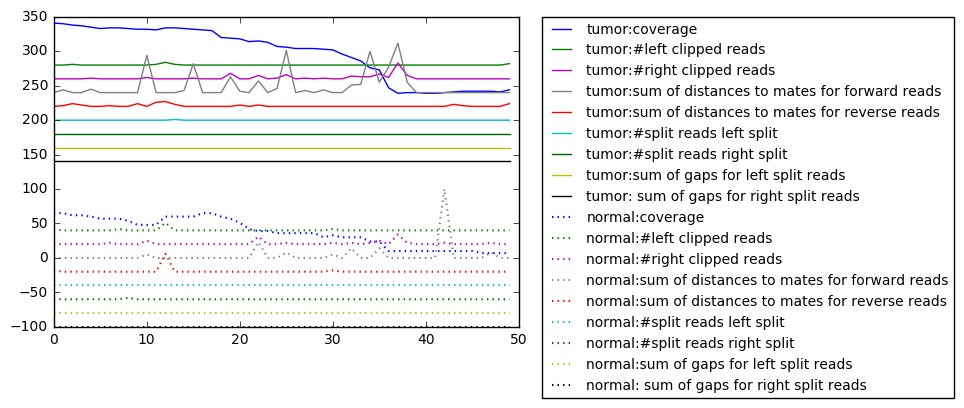

Manta:  del_start
DeepSV: ins_pos
id: 222


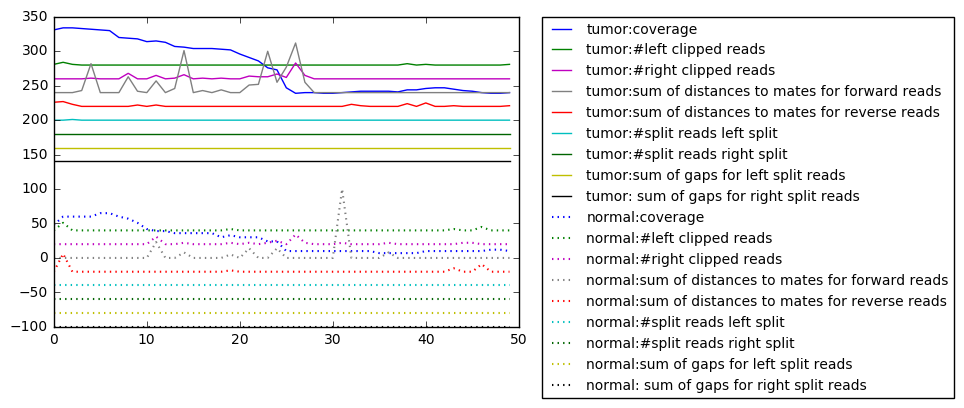

Manta:  del_start
DeepSV: ins_pos
id: 225


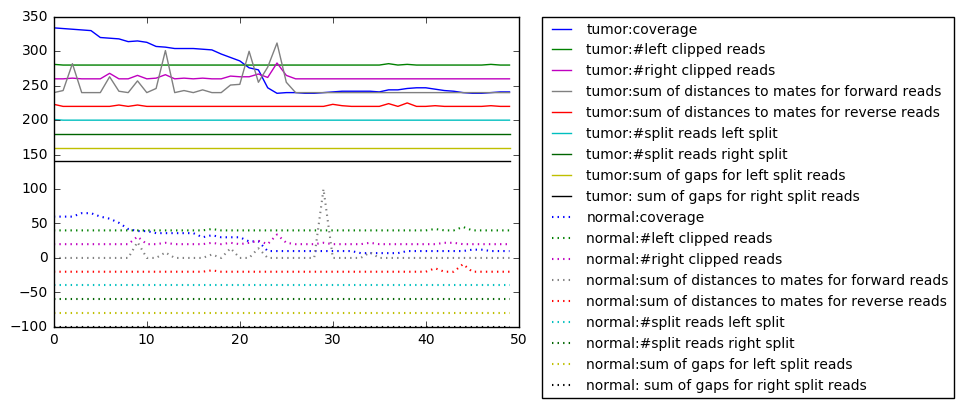

Manta:  del_end
DeepSV: ins_pos
id: 228


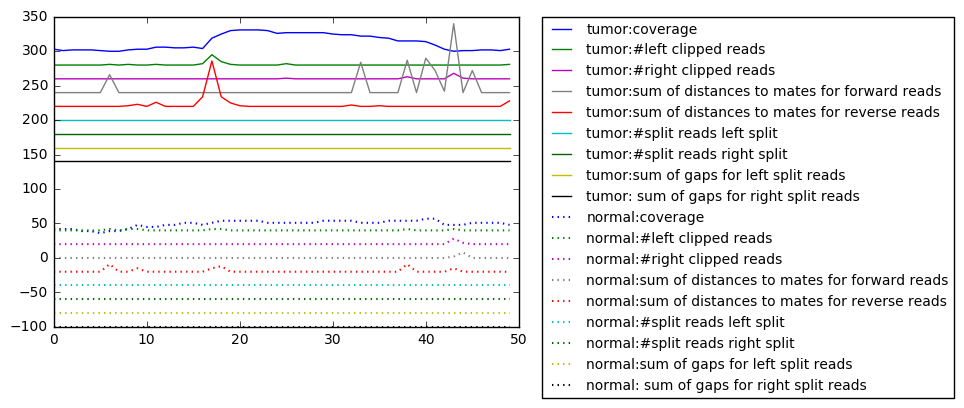

Manta:  del_end
DeepSV: ins_pos
id: 231


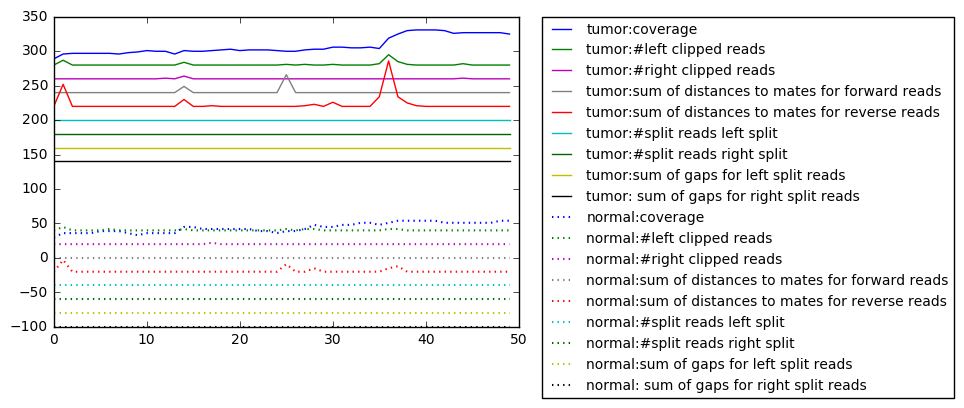

Manta:  del_end
DeepSV: ins_pos
id: 234


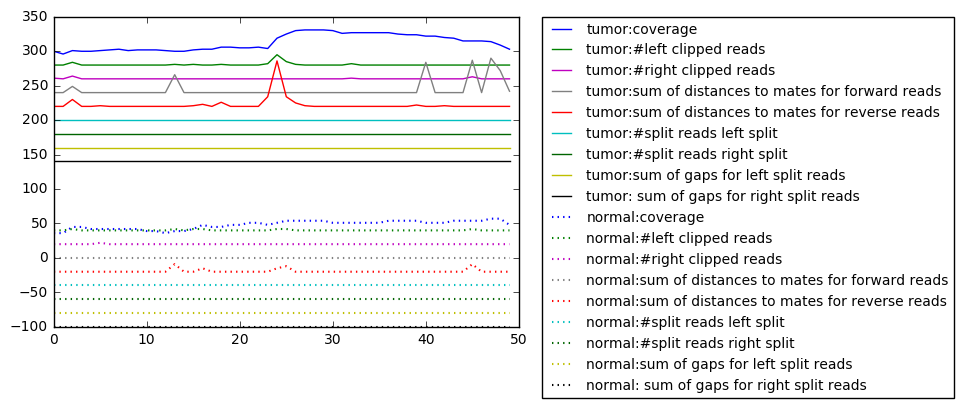

Manta:  del_end
DeepSV: ins_pos
id: 237


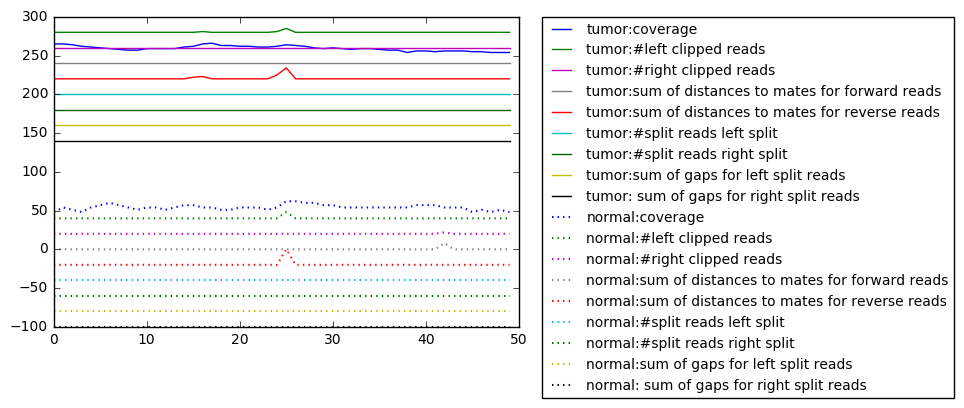

Manta:  del_start
DeepSV: ins_pos
id: 240


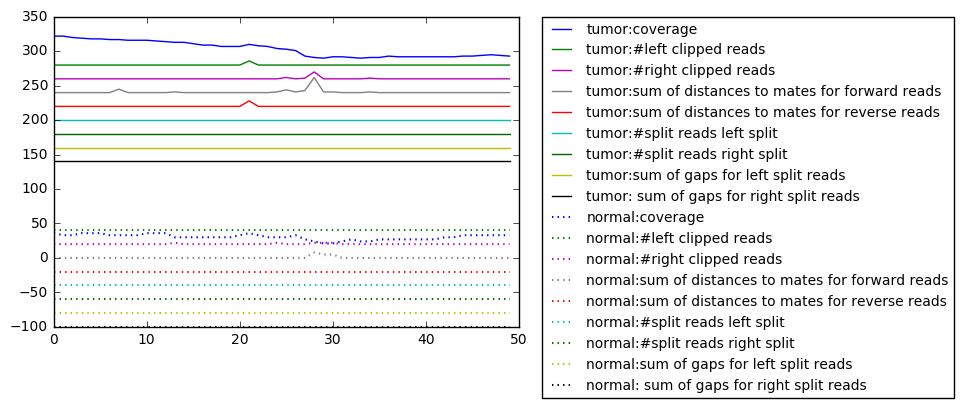

Manta:  del_start
DeepSV: ins_pos
id: 243


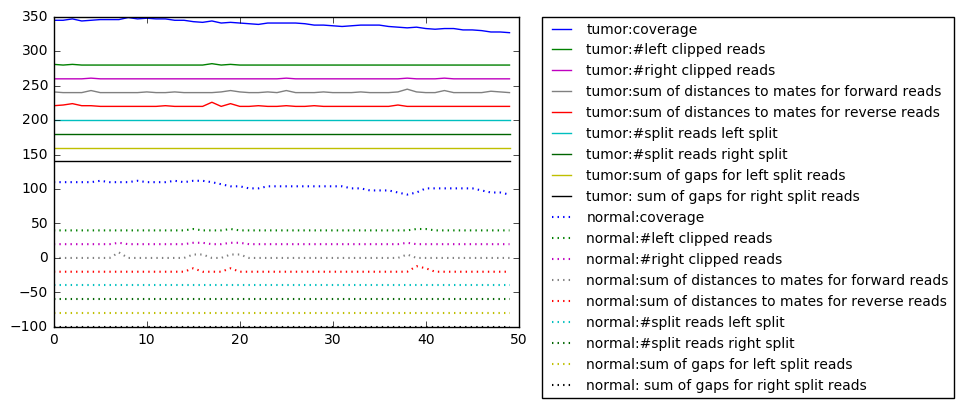

Manta:  del_start
DeepSV: ins_pos
id: 246


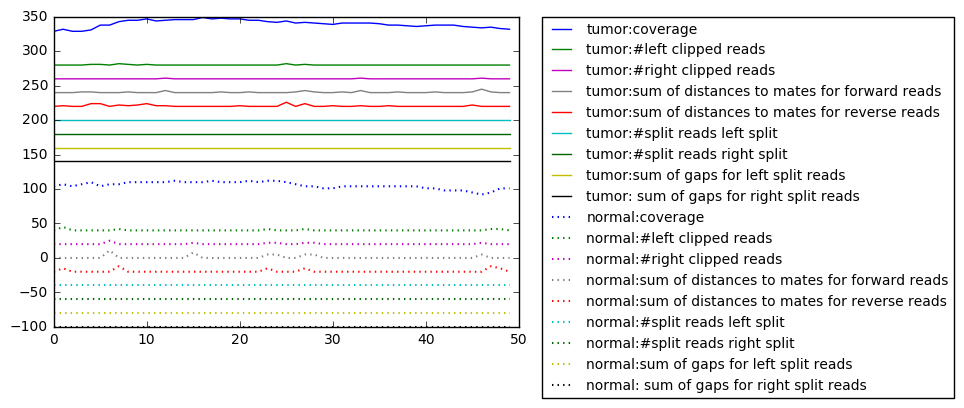

Manta:  del_end
DeepSV: del_end
id: 249


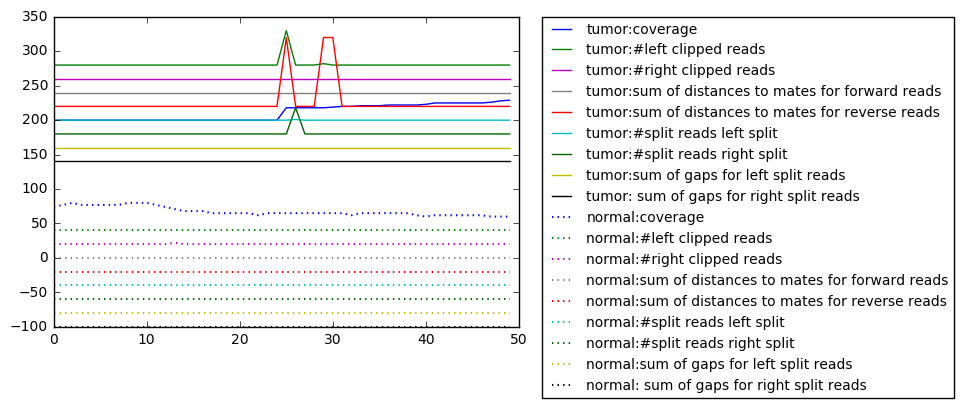

Manta:  del_end
DeepSV: del_end
id: 252


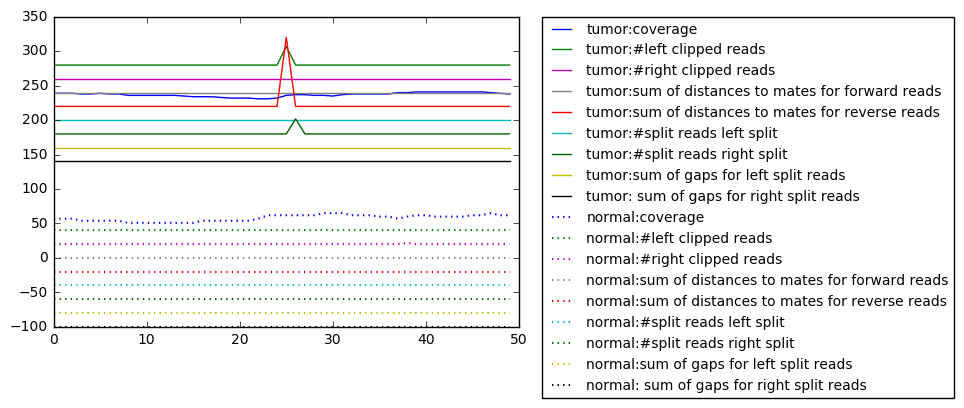

Manta:  del_end
DeepSV: ins_pos
id: 255


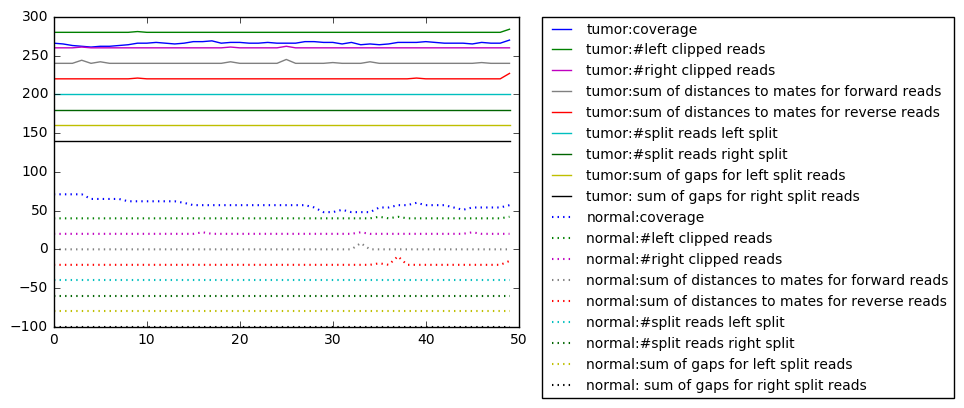

Manta:  del_start
DeepSV: ins_pos
id: 258


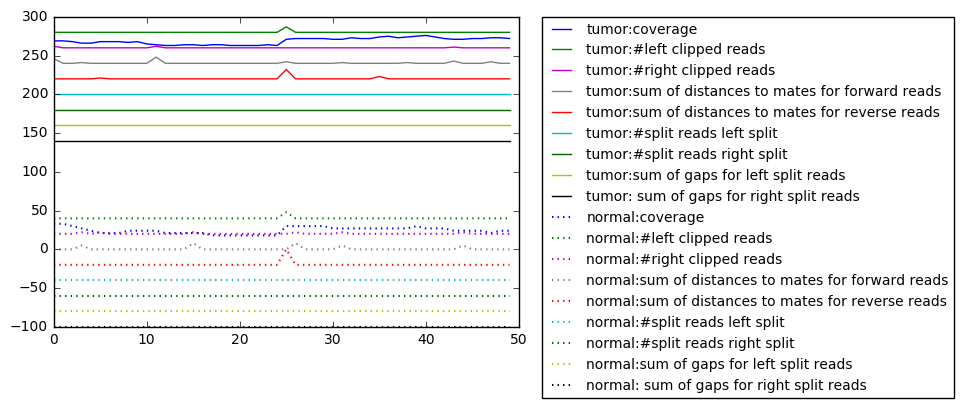

Manta:  del_start
DeepSV: del_start
id: 261


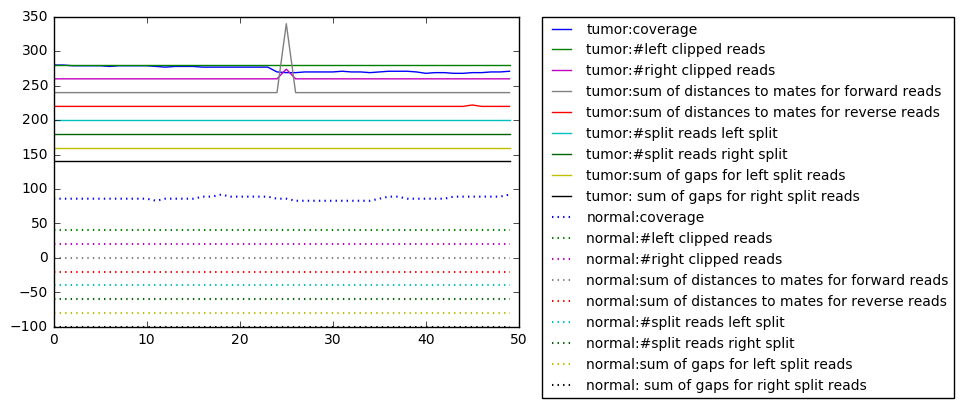

Manta:  del_end
DeepSV: del_end
id: 264


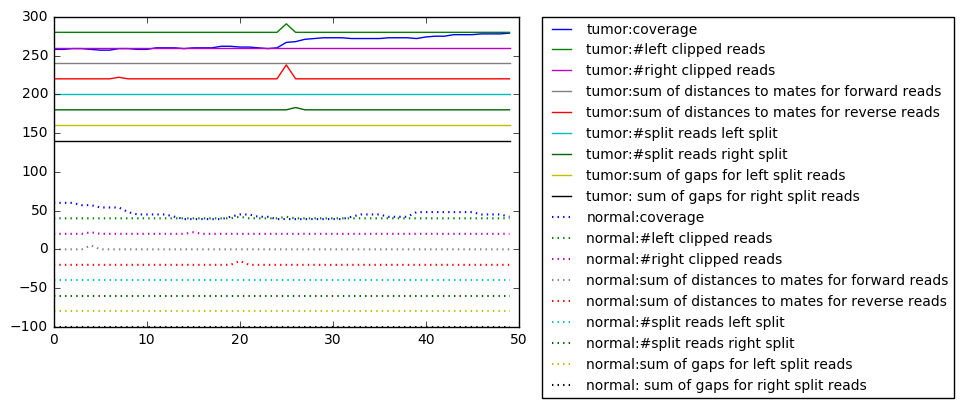

Manta:  del_start
DeepSV: ins_pos
id: 267


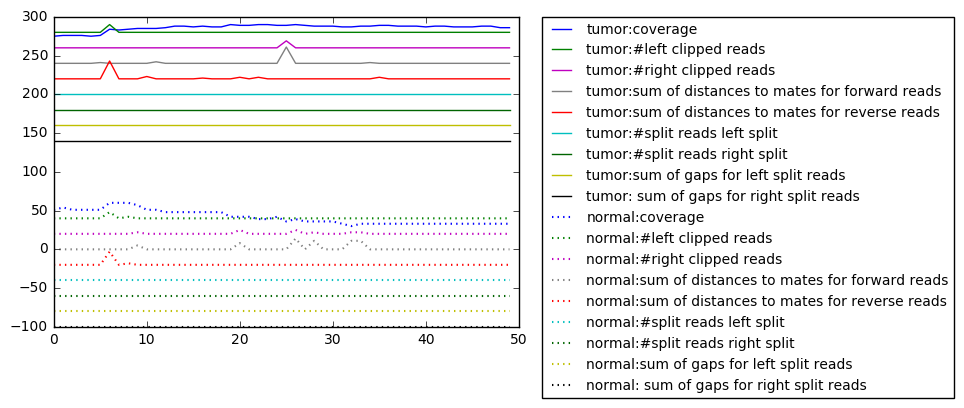

Manta:  del_start
DeepSV: del_start
id: 270


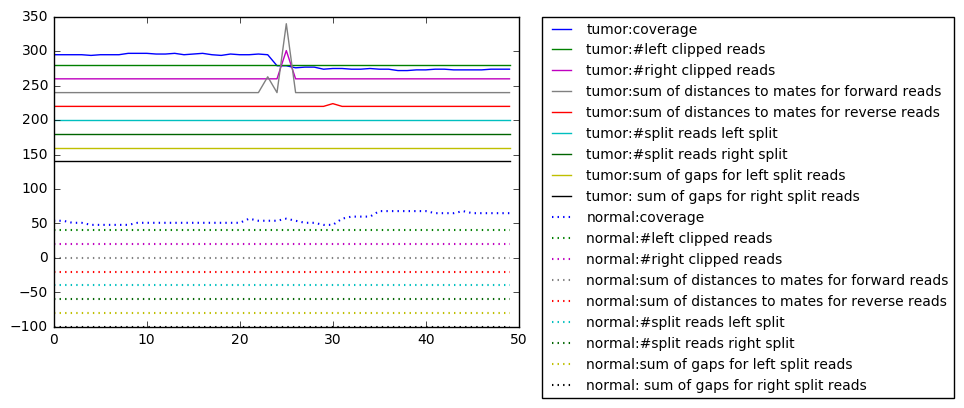

Manta:  del_start
DeepSV: del_start
id: 273


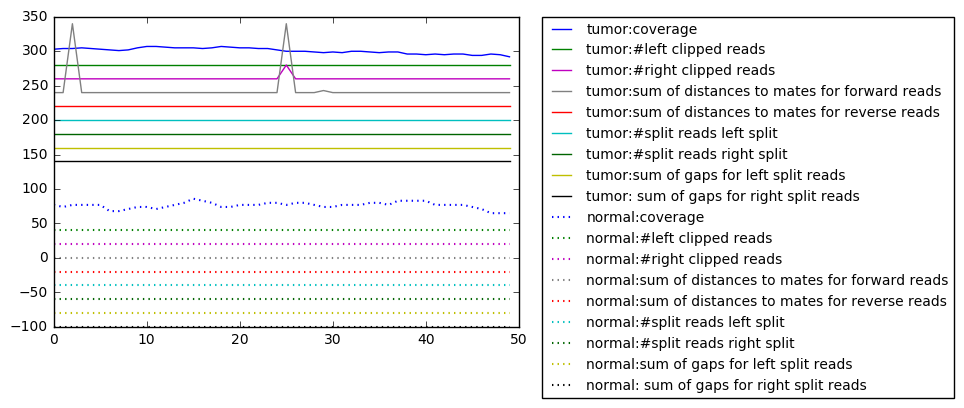

Manta:  del_end
DeepSV: ins_pos
id: 276


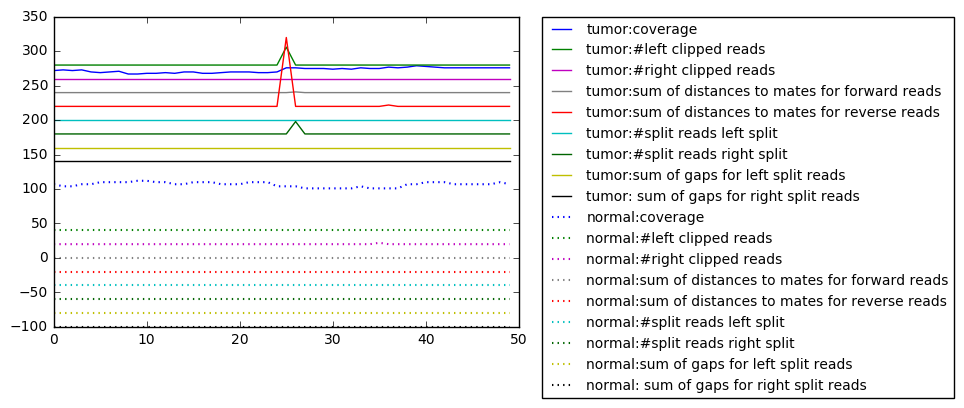

Manta:  del_end
DeepSV: ins_pos
id: 279


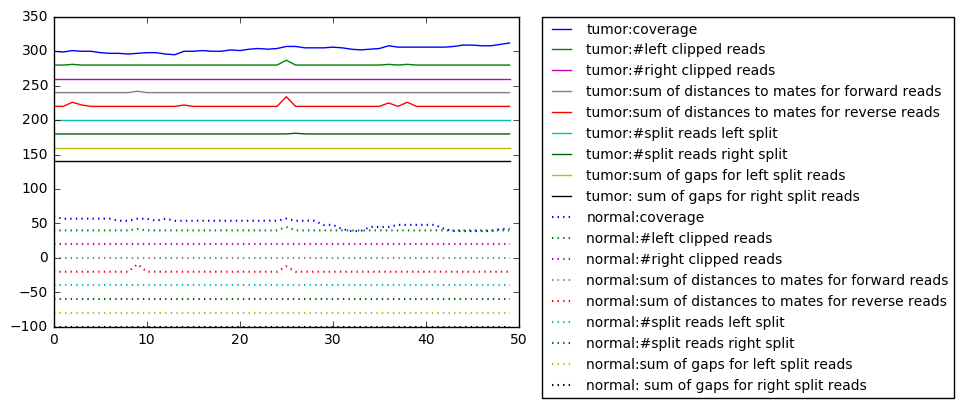

Manta:  del_start
DeepSV: del_end
id: 282


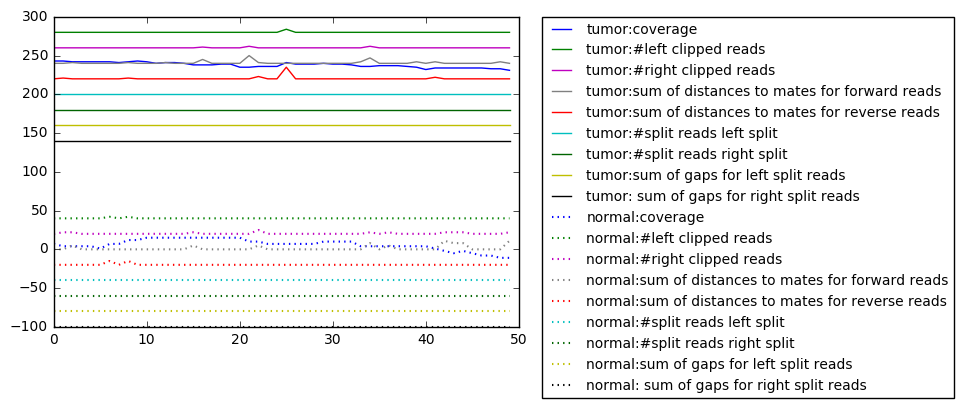

Manta:  del_end
DeepSV: ins_pos
id: 285


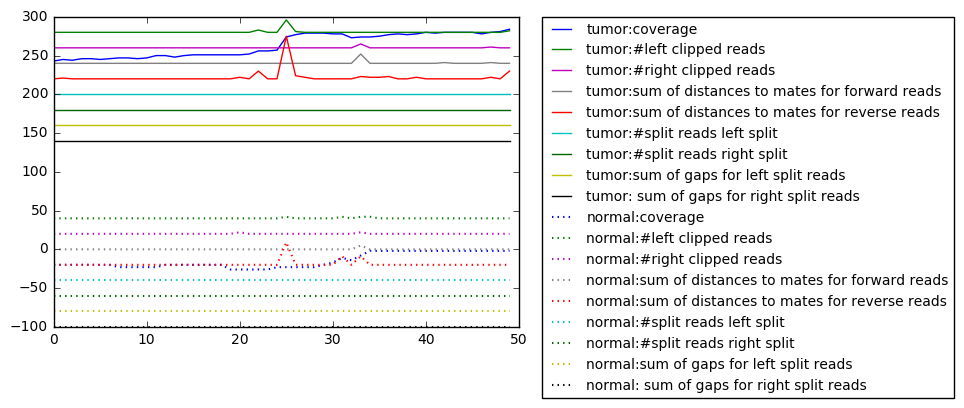

Manta:  del_end
DeepSV: ins_pos
id: 288


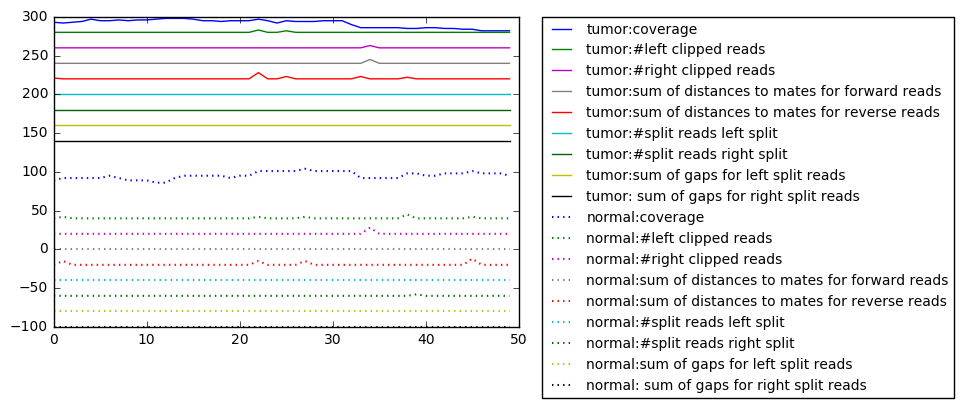

Manta:  del_start
DeepSV: del_start
id: 291


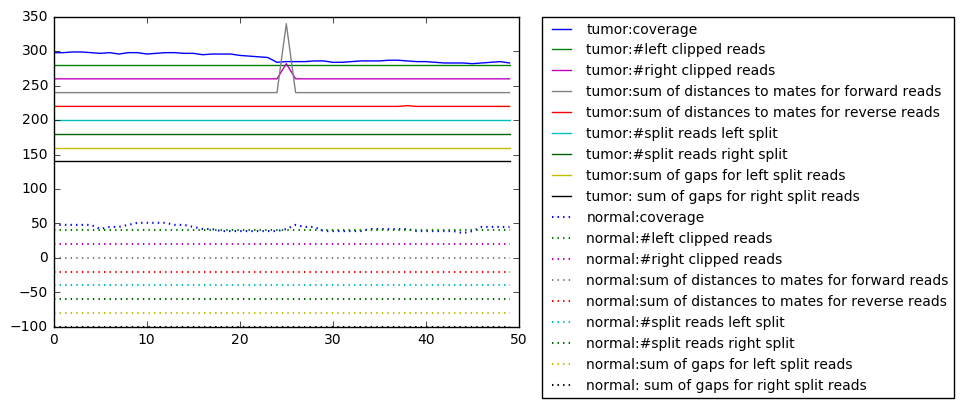

Manta:  del_start
DeepSV: ins_pos
id: 294


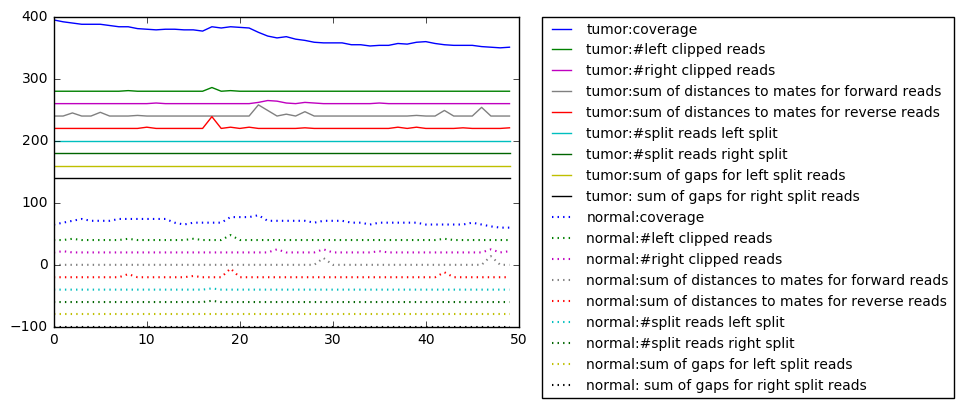

Manta:  del_start
DeepSV: ins_pos
id: 297


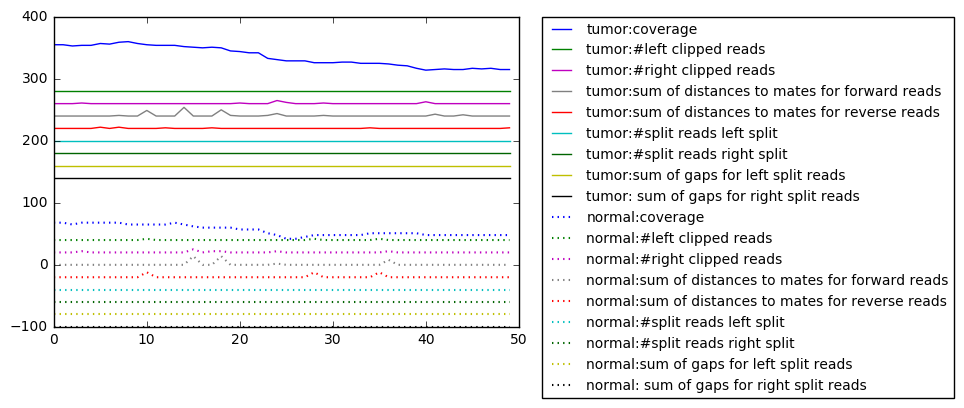

Manta:  del_end
DeepSV: del_end
id: 300


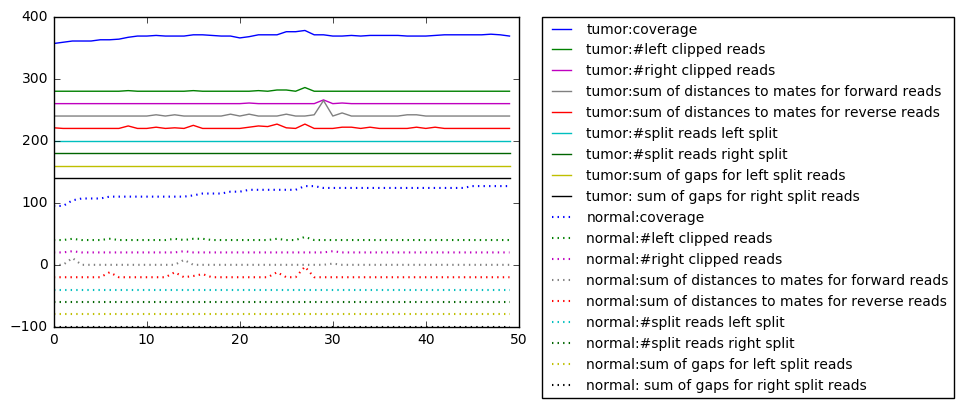

Manta:  del_end
DeepSV: ins_pos
id: 303


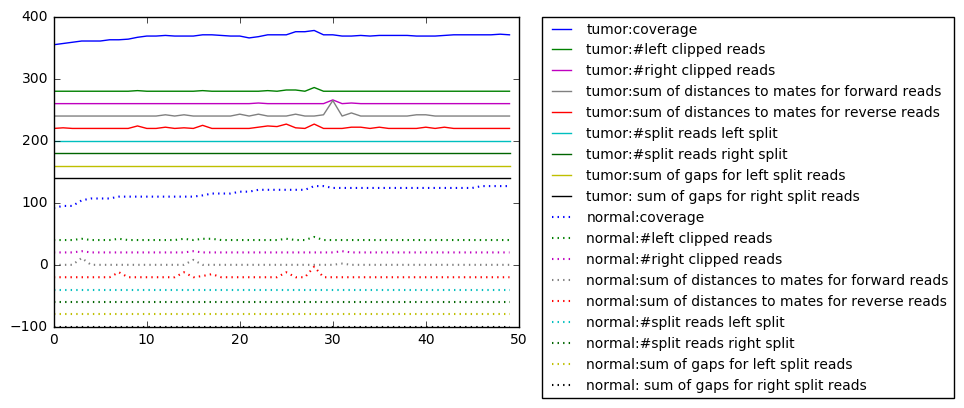

Manta:  del_end
DeepSV: ins_pos
id: 306


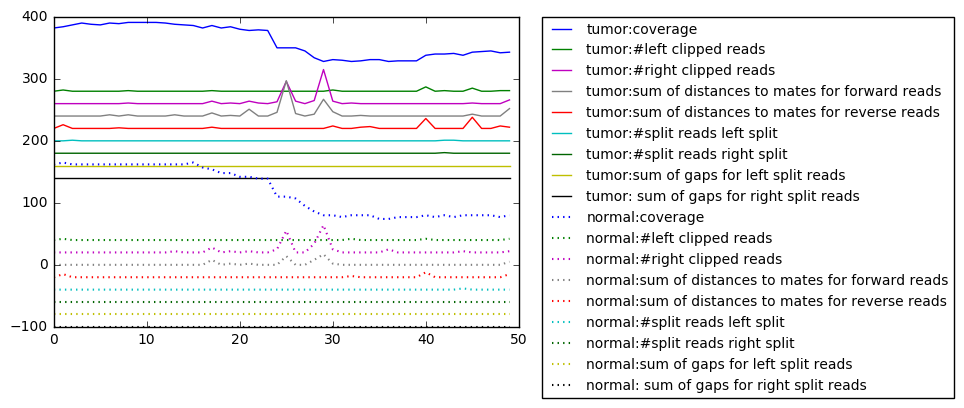

Manta:  del_start
DeepSV: ins_pos
id: 309


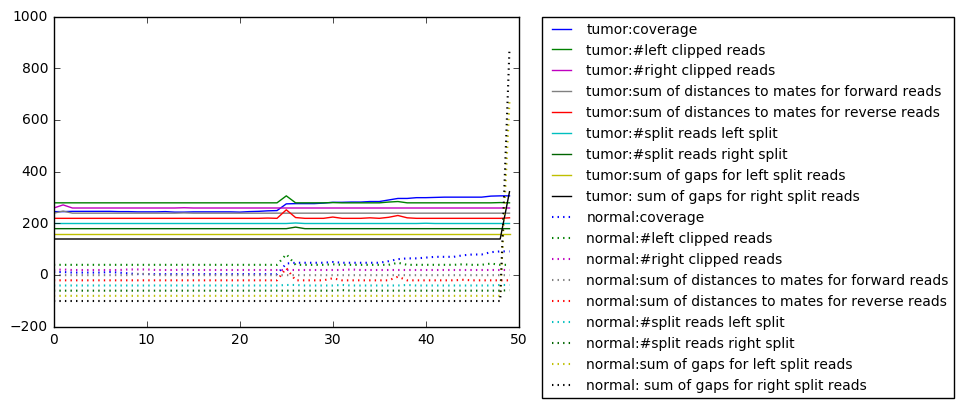

Manta:  del_start
DeepSV: ins_pos
id: 312


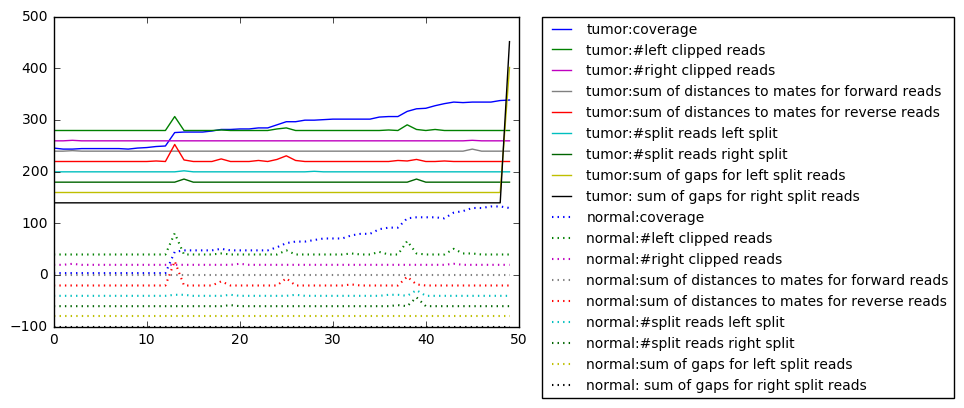

Manta:  del_start
DeepSV: ins_pos
id: 315


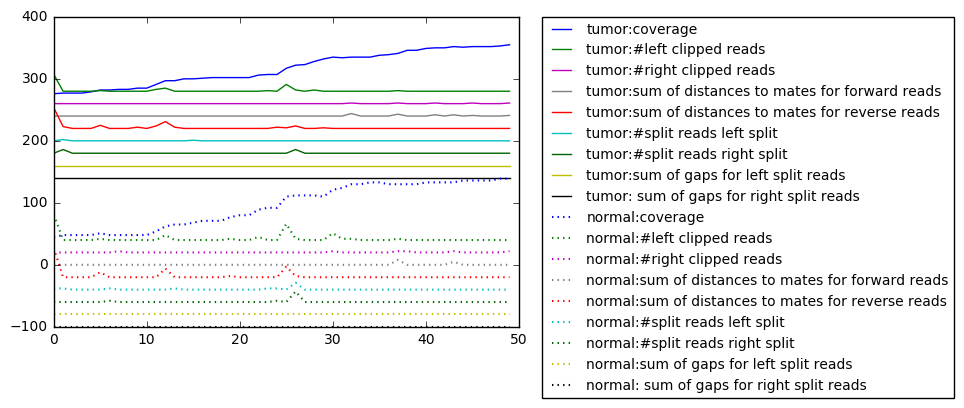

Manta:  del_start
DeepSV: ins_pos
id: 318


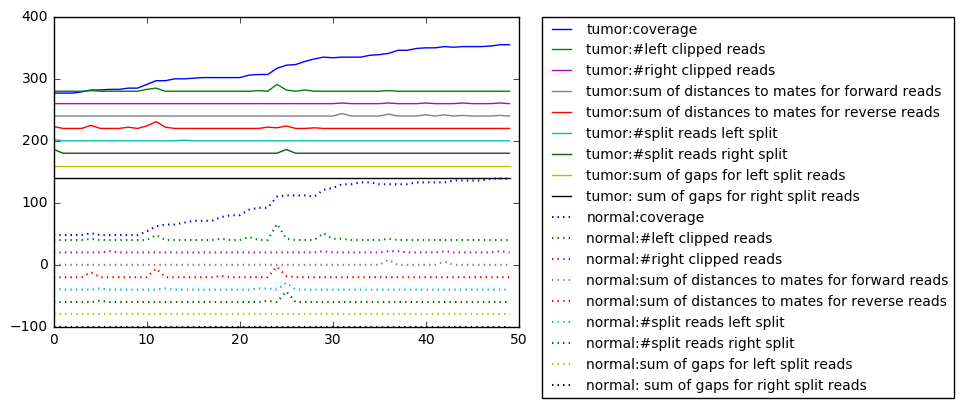

Manta:  del_end
DeepSV: ins_pos
id: 321


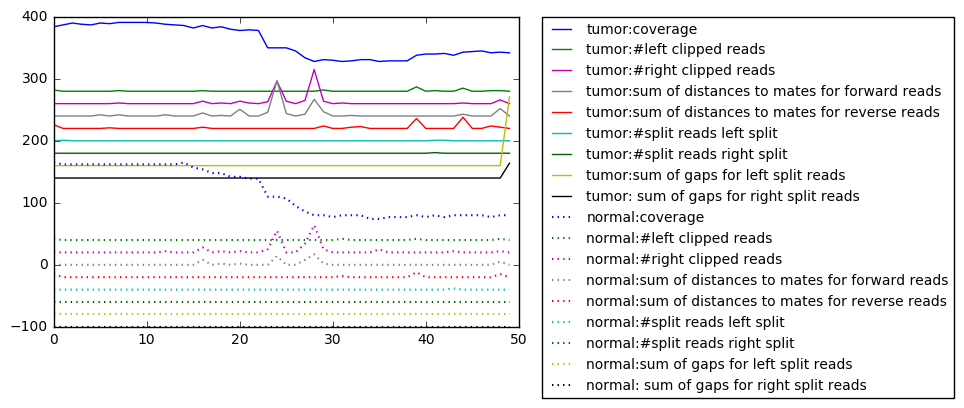

Manta:  del_end
DeepSV: del_start
id: 324


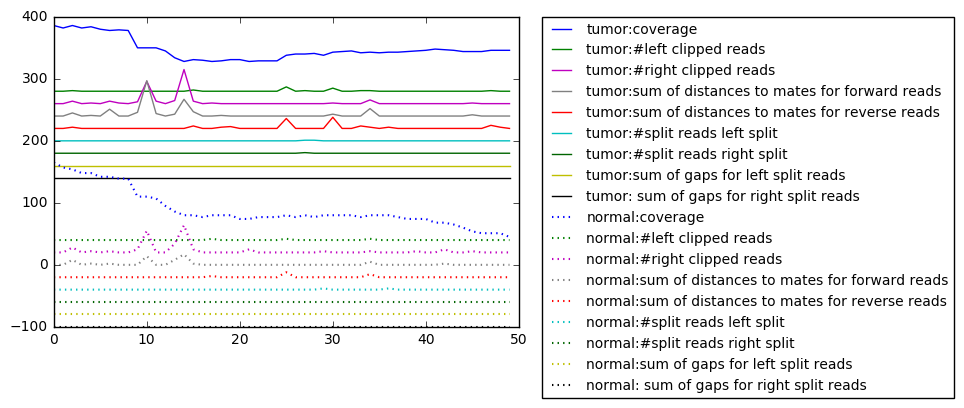

Manta:  del_start
DeepSV: ins_pos
id: 327


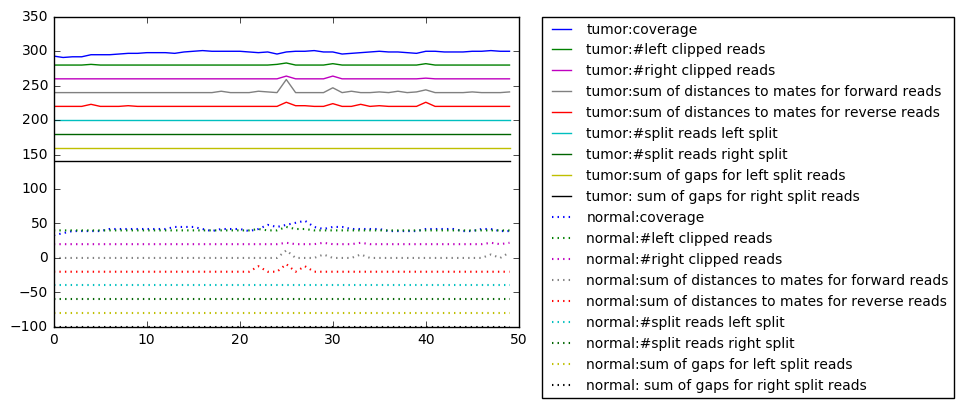

Manta:  del_start
DeepSV: ins_pos
id: 330


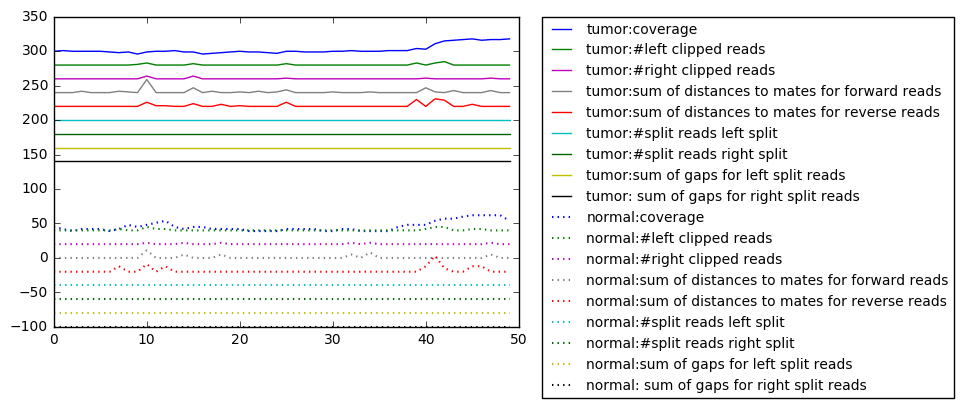

Manta:  del_end
DeepSV: ins_pos
id: 333


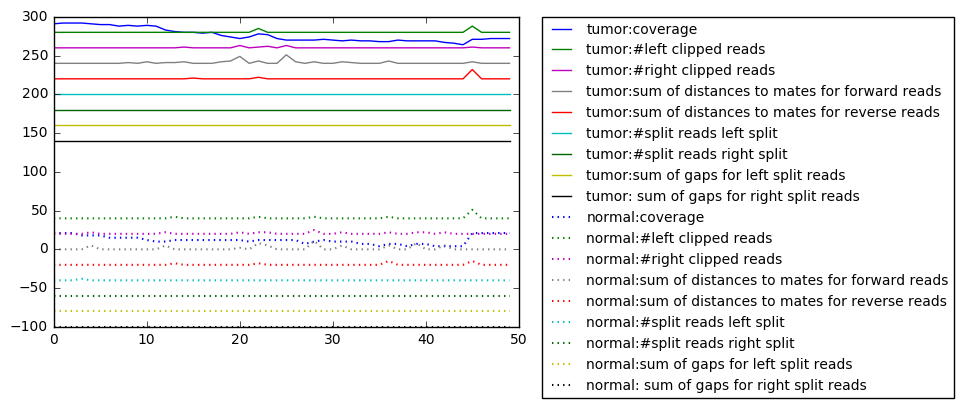

Manta:  del_end
DeepSV: del_start
id: 336


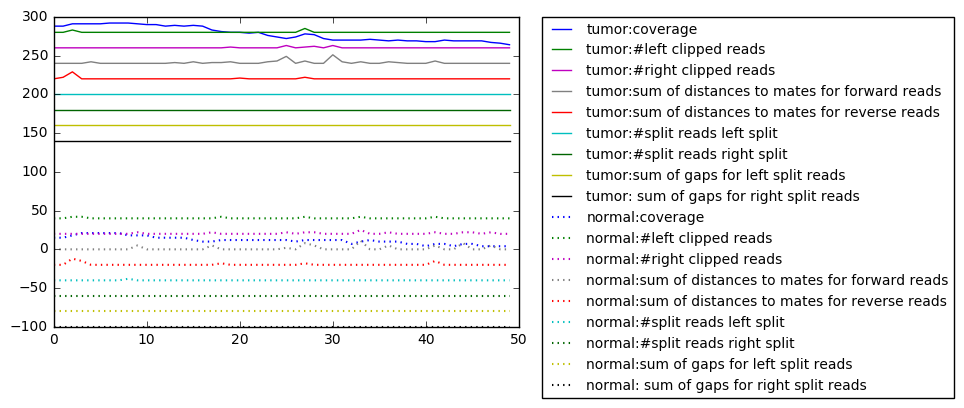

In [55]:
start_window = 0
n_windows = 338
X_train = X_test#only for plotting purposes
y_train=y_test
plot_channels(start_window, n_windows)

   
## Transposes every window in X, to comply to McFly format

In [65]:
def transposeDataset(X):
    image = []
    for i in range (0, len(X -1)):
        tr = X[i].transpose()
        image.append(tr)
    return np.array(image)

#image1 = transposeDataset(X_train)
#image2 = transposeDataset(X_val)
image3 = transposeDataset(X_test)
#X_train = image1
#X_val = image2
X_test = image3

n_channels = len(X_test[0][0])
print(len(X_test[0][0]))

18


## Prepare the labels in McFly format

In [57]:
#{'INS_pos': 0, 'DEL_end': 1, 'DEL_start': 2, 'noSV': 3}
mapclasses = {'ins_pos': 0, 'del_end': 1, 'del_start': 2, 'no_del':3}

In [59]:
y_test_new = np.array([mapclasses[c] for c in y_test], dtype='int')
print(y_test_new)
y_test_binary = to_categorical(y_test_new, num_classes = 4)

[2 1 1 1 1 1 2 1 2 1 2 2 1 1 2 2 1 1 1 2 1 1 2 1 2 1 1 2 2 2 2 2 2 1 1 1 2
 2 1 2 1 2 1 1 2 1 1 2 2 1 2 1 1 1 1 1 2 2 1 1 1 1 1 2 2 2 2 1 1 2 1 2 1 2
 1 1 1 1 1 1 2 2 1 2 1 1 1 1 1 1 2 1 2 1 2 1 2 1 2 2 1 2 2 2 2 2 2 1 1 1 2
 2 1 1 1 2 2 1 1 2 1 2 1 2 2 2 1 1 1 1 2 2 2 2 1 2 2 1 1 1 1 1 1 2 2 2 2 1
 1 1 2 2 1 2 1 2 1 2 1 1 1 1 1 1 2 1 2 1 2 2 2 2 2 1 1 1 2 2 2 2 2 2 2 2 2
 2 2 2 1 1 2 1 1 2 2 2 2 2 1 2 1 2 2 2 2 2 2 1 1 1 2 1 1 1 1 2 2 2 2 2 2 2
 2 2 2 2 2 2 1 1 1 1 1 1 1 2 1 1 2 1 2 2 2 2 2 1 2 2 2 1 1 2 1 2 2 1 1 2 2
 2 1 2 1 1 1 2 1 2 2 1 2 1 2 2 2 1 1 1 2 1 2 2 2 1 1 1 2 1 1 1 1 2 1 2 2 2
 2 2 2 1 1 1 1 1 1 1 1 1 1 2 1 2 2 1 1 2 1 1 2 1 2 1 1 1 1 2 2 2 2 2 2 2 2
 1 1 1 1 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3]


In [60]:
y_test_binary


array([[ 0.,  0.,  1.,  0.],
       [ 0.,  1.,  0.,  0.],
       [ 0.,  1.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0.,  1.],
       [ 0.,  0.,  0.,  1.],
       [ 0.,  0.,  0.,  1.]])

## Reload the best current model

In [61]:
import os
from keras.models import load_model
model_path = os.path.join('F:/CNN/notebooks/', 'Gtcg_010618_trimmed_dist_10purity_nosv')
model_reloaded = load_model(model_path)

## Prepare the confusion matrix

In [62]:
dict=mapclasses
dict_sorted = sorted(dict.items(), key=lambda x: x[1])
dict_sorted

[('ins_pos', 0), ('del_end', 1), ('del_start', 2), ('no_del', 3)]

In [63]:
labels = [i[0] for i in dict_sorted]

## Columns are predicted by DeepSV,  rows are labels by Manta

In [66]:
import pandas as pd
model = model_reloaded
datasize = X_test.shape[0]
probs = model.predict_proba(X_test[:datasize,:,:],batch_size=1)
predicted = probs.argmax(axis=1)
y_index = y_test_binary.argmax(axis=1)
confusion_matrix = pd.crosstab(pd.Series(y_index), pd.Series(predicted))
confusion_matrix.index = [labels[i] for i in confusion_matrix.index]
confusion_matrix.columns = [labels[i] for i in confusion_matrix.columns]
confusion_matrix.reindex(columns=[l for l in labels], fill_value=0)
confusion_matrix

,ins_pos,del_end,del_start,no_del
del_end,16,57,2,95
del_start,29,25,35,79
no_del,25,17,4,104


## Test best current model on testset

### Overall accuracy on the test set:

In [67]:
score_test = model_reloaded.evaluate(X_test, y_test_binary, verbose=False)
print('Test loss and accuracy of best model: ' + str(score_test))

Test loss and accuracy of best model: [5.046447447088898, 0.40163934426229508]
